# ***Analyzing Granted Projects of the European Research Council (ERC) to Understand Where Science Money Goes***

Final project in the course "The Art of Analyzing Big Data - The Data Scientist’s Toolbox Final Project". 

Authors: Aviv Rovshitz & Leor Ariel Rose.

## ***Setup***



### ***Import packages***

Let's begin with importing all necessary packages:

In [1]:
import pprint
import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import pycountry
import warnings
import missingno as msno
from matplotlib import pyplot as plt
from tqdm import tqdm_notebook as tqdm
from plotly import express as px
from pathlib import Path
from pprint import pprint
from wordcloud import WordCloud
from itertools import combinations


warnings.filterwarnings("ignore")


sns.set_context("paper")

### ***Constant definitions***

Next, let's define all constant variables:

In [2]:
# Define path to data
DATA_PATH = Path("./data")
# Define path to erc data csv
ERC_DATA_FILE = DATA_PATH.joinpath("erc_data.csv")
# Define path to erc dates csv
ERC_DATES_FILE = DATA_PATH.joinpath("erc_dates.csv")

### ***Auxiliary methods***

Next, let's define all auxiliary methods:


In [3]:
def symbol_to_name(symbol) -> str:
    """Function to convert country symbol to name

    Args:
        symbol (str): country symbol

    Returns:
        str: country name
    """
    try:
        country = pycountry.countries.get(alpha_2=symbol)
        return country.name
    except AttributeError:
        return "Unknown"

## ***Data loading***

For this project we are going to use the [ERC dataset](https://erc.easme-web.eu/#). This dataset has information about projects funded by the European Research Council. The data has all the needed information except dates of each project which we scraped from their new [dashboard](https://dashboard.tech.ec.europa.eu/qs_digit_dashboard_mt/public/sense/app/afe00964-3272-45c4-b60c-b64ed20d98d1/sheet/61a0bd1d-cd6d-4ac8-8b55-80d8661e44c0/state/analysis) using selenium (code: [date_scraper.ipynb](date_scraper.ipynb)).

Let's read the data:

In [4]:
# Read erc csv
erc_data_df = pd.read_csv(ERC_DATA_FILE, delimiter=';')
erc_data_df["Project number"] = erc_data_df["Project number"].astype("Int32")
erc_data_df["Project budget"] = erc_data_df["Project budget"].str.replace(
    ".", ''
).astype("float32")

# Read erc projects dates
erc_dates_df = pd.read_csv(ERC_DATES_FILE)
erc_dates_df["Project number"] = erc_dates_df["Project number"].astype("Int32")
erc_dates_df["Start Date"] = pd.to_datetime(erc_dates_df["Start Date"])
erc_dates_df["End Date"] = pd.to_datetime(erc_dates_df["End Date"])

# Combine data frames
erc_full_df = pd.merge(
    erc_data_df, erc_dates_df, on="Project number", how="left"
)

## ***Data cleaning***

In this section we will clean the data and validate it is usable for statistical analysis and machine learning pipelines.

### ***Missing data***

Let's begin by looking at the percentage of missing values in each column:

In [5]:
# Print the percentage of missing values in each column
print("Percentage of missing values in each colum")
erc_full_df.isna().sum() / erc_full_df.shape[0]

Percentage of missing values in each colum


Project number      0.006908
Project acronym     0.000000
Project title       0.000000
Abstract            0.027079
PI                  0.007461
Grant type          0.006977
Topic               0.024109
Project budget      0.006908
Call ID             0.006908
Host Institution    0.006908
City                0.013816
Country             0.013816
Start Date          0.006908
End Date            0.006908
dtype: float64

We can see that there are not a lot of missing values (~0.03%), but lets take a deeper look using missingno:

Nullity matrix of the data:



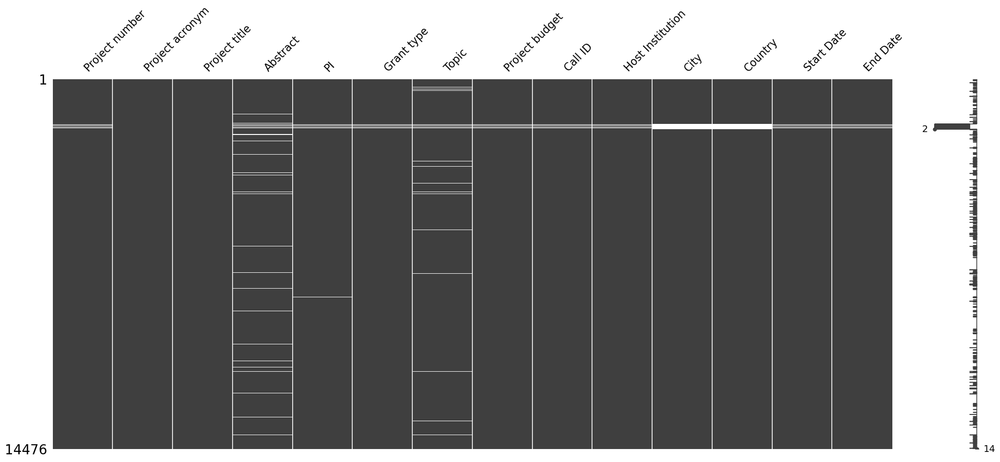

In [6]:
# Visualize the nullity matrix
print("Nullity matrix of the data:", end="\n\n")
ax = msno.matrix(erc_full_df)

Looking at the nullity matrix we can see that records where project number does not exist have a lot of other missing values, so let's get rid of them:

In [7]:
# Print the percentage of missing values in each column
print(
    "Percentage of missing values in each colum (after removing)"
    " 'Project number' empty records"
)
erc_full_df.isna().sum() / erc_full_df.shape[0]

Percentage of missing values in each colum (after removing) 'Project number' empty records


Project number      0.006908
Project acronym     0.000000
Project title       0.000000
Abstract            0.027079
PI                  0.007461
Grant type          0.006977
Topic               0.024109
Project budget      0.006908
Call ID             0.006908
Host Institution    0.006908
City                0.013816
Country             0.013816
Start Date          0.006908
End Date            0.006908
dtype: float64

Nullity matrix of the data (after removing 'Project number' empty records):



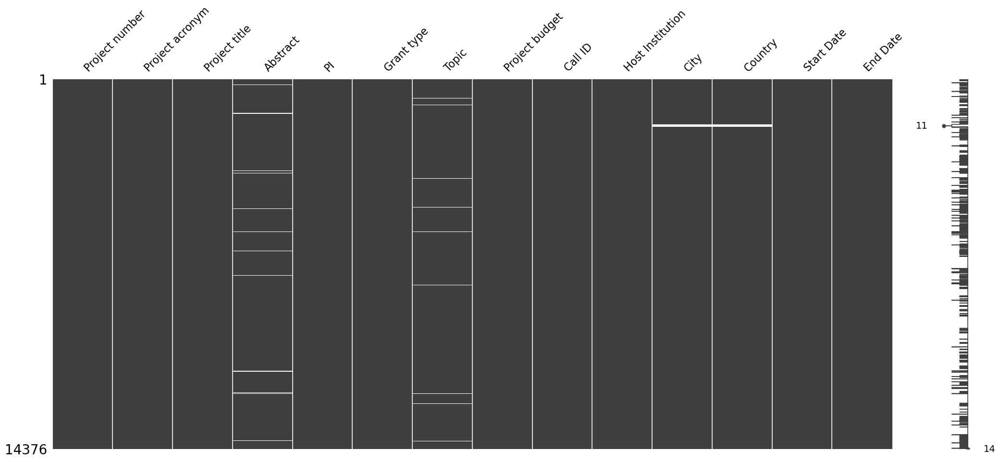

In [8]:
# Get tid of records without project number
erc_full_df = erc_full_df[~erc_full_df["Project number"].isna()]
print(
    (
        "Nullity matrix of the data (after removing"
        " 'Project number' empty records):"
    ), end="\n\n"
)
ax = msno.matrix(erc_full_df)

Now it looks like we have missing abstracts, PI, grant types, topics, cities and countries.
Let's look at the missing cities and countries to see if we can impute it:

In [9]:
# Print the Host Institution of records with missing country
erc_full_df[(erc_full_df["Country"].isna())]["Host Institution"].unique()

array(['French Alternative Energies and Atomic Energy Commission'],
      dtype=object)

In [10]:
# Print the Host Institution of records with missing city
erc_full_df[(erc_full_df["City"].isna())]["Host Institution"].unique()

array(['French Alternative Energies and Atomic Energy Commission'],
      dtype=object)

So the Host Institution of all the missing cities and countries is "French Alternative Energies and Atomic Energy Commission" so we can impute the country France and the city Paris:

In [11]:
# Fill 'FR' & 'Paris' in Country & City
indexes = erc_full_df[(erc_full_df["Country"].isna()) | (erc_full_df["City"].isna())].index.tolist()
erc_full_df.loc[indexes, "City"]= "Paris"
erc_full_df.loc[indexes, "Country"] = "FR"

Next, let's look at the missing grant type:

In [12]:
erc_full_df[erc_full_df["Grant type"].isna()]

,Project number,Project acronym,Project title,Abstract,PI,Grant type,Topic,Project budget,Call ID,Host Institution,City,Country,Start Date,End Date
11659,101071255,X-MESH,An eXtreme Mesh deformation method to follow s...,NaN,REMACLE Jean-François,NaN,Synergy Grants,0.0,ERC-2022-SYG,University of Louvain,LOUVAIN-LA-NEUVE,BE,2023-01-09,2029-08-31


We an see the missing Grant type has 0.0 budget so lets remove this record because it does not have any valuable information:

In [13]:
erc_full_df=erc_full_df[~erc_full_df["Grant type"].isna()]

We can not impute the abstract, PI or topic but we still have valuable information in these records so we will not remove them. 

In [14]:
# TODO: Build a classifier using project title to get the topic and then use it to
# Impute the topic of missing topics

### ***Adding new columns***

Let's create a column containing the country name and not only country symbol:

In [14]:
# Fix symbol of United Kingdom and Greece 
erc_full_df.loc[erc_full_df.Country == "UK", "Country"] = "GB"
erc_full_df.loc[erc_full_df.Country == "EL", "Country"] = "GR"
# Get country name for each record
erc_full_df["Country name"] = erc_full_df.Country.apply(symbol_to_name)

Next, let's add some new columns regarding each projects date:

In [15]:
# Add project years & days duration
erc_full_df["days_duration"] = (erc_full_df["End Date"] - erc_full_df["Start Date"]).dt.days
erc_full_df["years_duration"] = erc_full_df["days_duration"]  / 365
erc_full_df["start_year"] = erc_full_df["Start Date"].dt.year

## **Univariate descriptive statistics**

Let's begin with visualizing the number of grants by grant type:

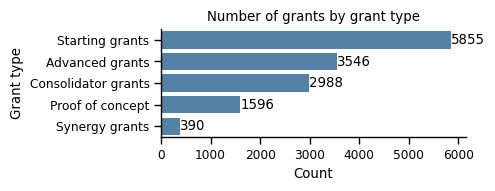

In [17]:
# Plot the number of grants by grant type
column = "Grant type"
fig, ax = plt.subplots(figsize=(5, 2))
ax = sns.countplot(
    erc_full_df, y=column, order=erc_full_df[column].value_counts().index,
    ax=ax, color="steelblue"
)
ax.bar_label(ax.containers[0])
plt.title(f"Number of grants by {column.lower()}")
plt.xlabel("Count")
sns.despine()
plt.tight_layout()
plt.show()

Next, let's visualize the number of grants by topic:

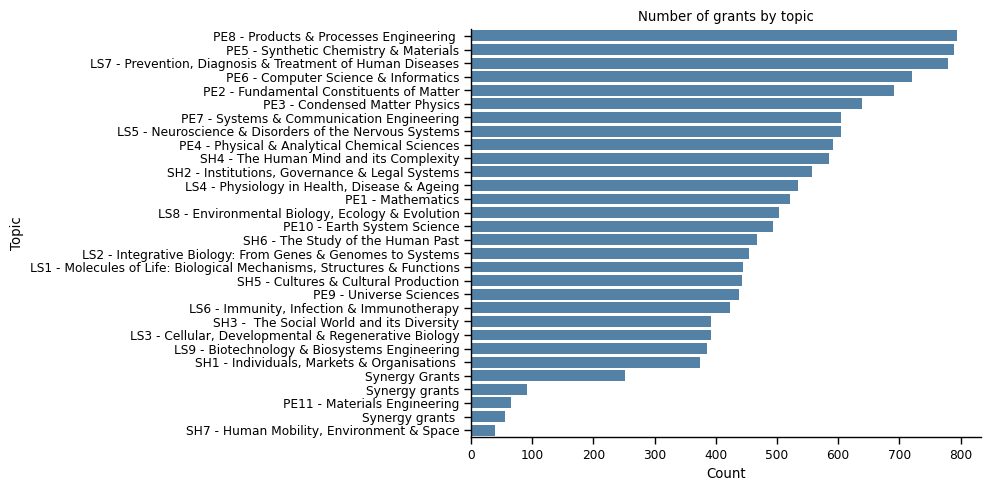

In [18]:
# Plot the number of grants by topic
column = "Topic"
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.countplot(
    erc_full_df, y=column, order=erc_full_df[column].value_counts().index,
    ax=ax, color="steelblue"
)
plt.title(f"Number of grants by {column.lower()}")
plt.xlabel("Count")
sns.despine()
plt.tight_layout()
plt.show()

Next, let's visualize the number of grants by host institution:

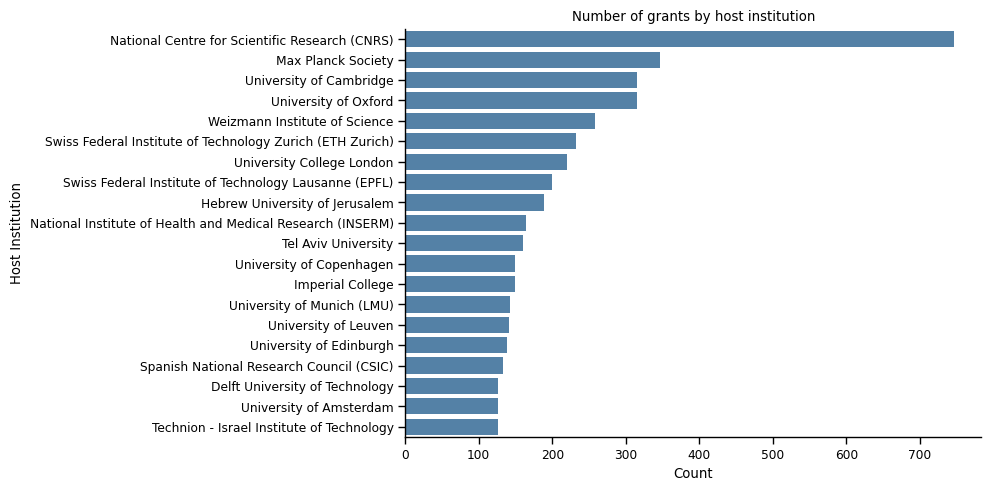

In [19]:
# Plot the number of grants by host institution
top_k = 20
column = "Host Institution"
fig, ax = plt.subplots(figsize=(10, 5))
sns.countplot(
    erc_full_df, y=column,
    order=erc_full_df[column].value_counts().iloc[:top_k].index, ax=ax,
    color="steelblue"
)
plt.title(f"Number of grants by {column.lower()}")
plt.xlabel("Count")
sns.despine()
plt.tight_layout()
plt.show()

Next, let's visualize the number of grants by call ID:

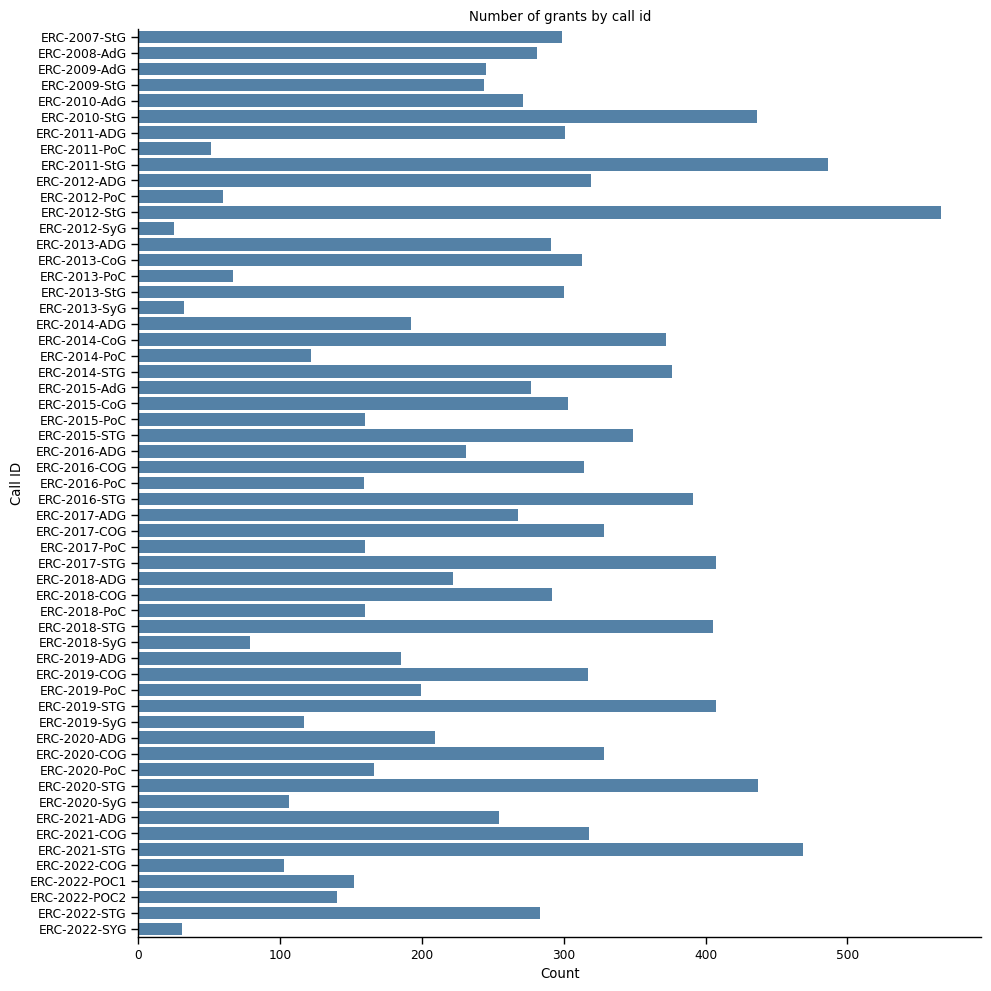

In [20]:
# Plot the number of grants by Call ID
column = "Call ID"
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.countplot(
    erc_full_df, y=column, order=np.sort(
        erc_full_df.loc[~erc_full_df[column].isna(), column].unique()
    ), ax=ax, color="steelblue"
)
plt.title(f"Number of grants by {column.lower()}")
plt.xlabel("Count")
sns.despine()
plt.tight_layout()
plt.show()

Next, let's visualize the number of grants by country name:

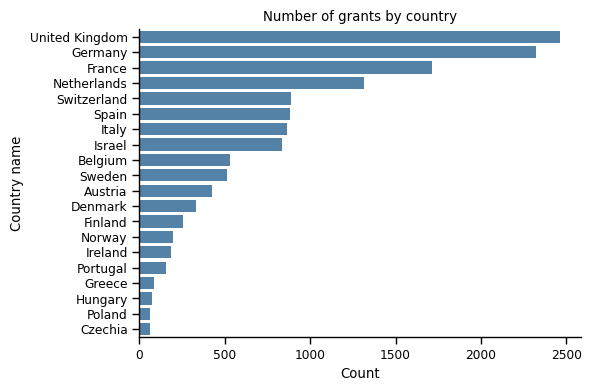

In [21]:
# Plot the number of project distribution by country
top_k = 20
column = "Country name"
fig, ax = plt.subplots(figsize=(6, 4))
sns.countplot(
    erc_full_df, y=column,
    order=erc_full_df[column].value_counts().iloc[:top_k].index, ax=ax,
    color="steelblue"
)
plt.title(f"Number of grants by country")
plt.xlabel("Count")
sns.despine()
plt.tight_layout()
plt.show()

Next, let's visualize the grants budget distribution:

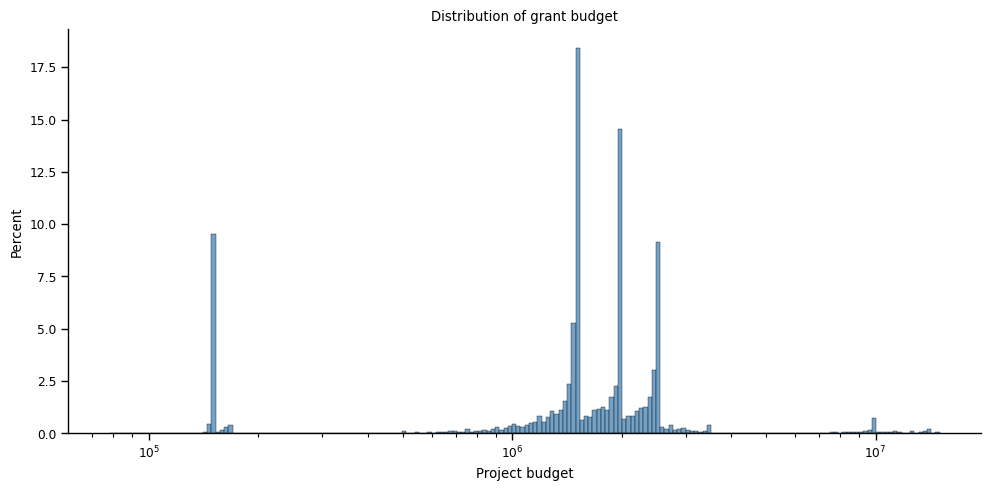

In [22]:
# Plot the grants budget distribution
column = "Project budget"
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(
    erc_full_df, x=column, ax=ax, color="steelblue", log_scale=True,
    stat="percent"
)
plt.title(f"Distribution of grant budget")
sns.despine()
plt.tight_layout()
plt.show()

Next, let's visualize the grant year duration distribution:

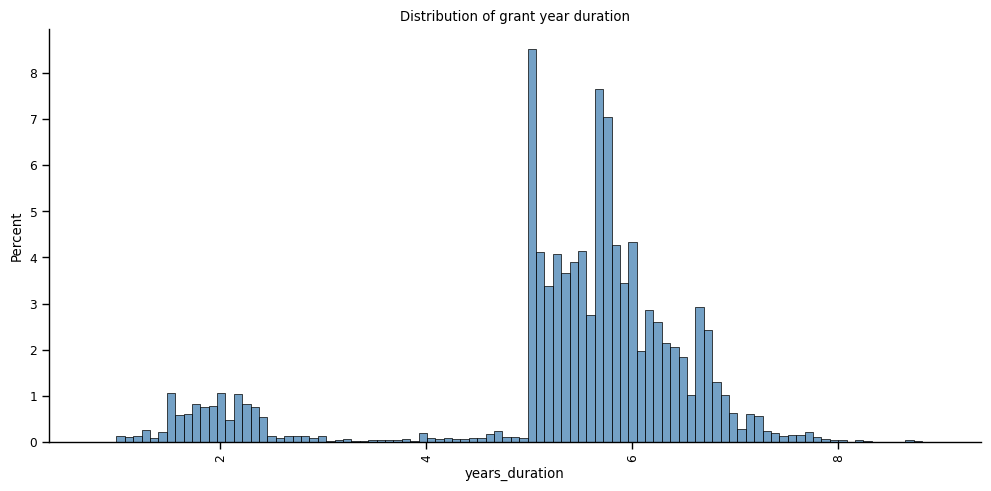

In [23]:
# Plot the grant year duration distribution
column = "years_duration"
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(
    erc_full_df, x=column, ax=ax, color="steelblue",
    stat="percent"
)
plt.title(f"Distribution of grant year duration")
plt.xticks(rotation=90)
sns.despine()
plt.tight_layout()
plt.show()

Let's visualize the most common words in grants titles:

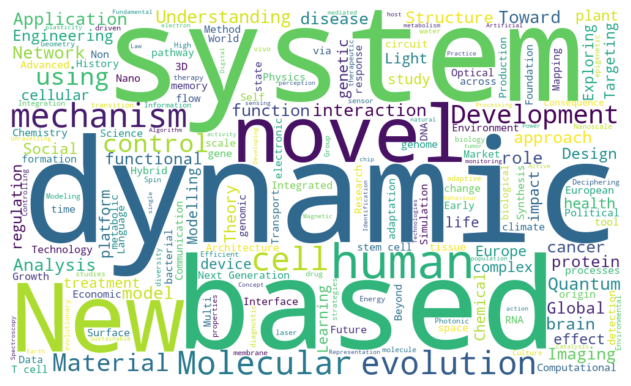

In [24]:
wordcloud = WordCloud(width=1000, height=600, background_color="white")
wordcloud.generate(" ".join(erc_full_df["Project title"]))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()

Let's visualize the most common words in grants abstract:

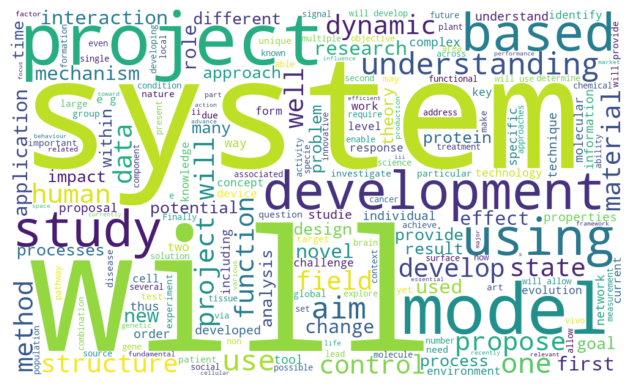

In [25]:
wordcloud = WordCloud(width=1000, height=600, background_color="white")
wordcloud.generate(" ".join(erc_full_df.loc[~erc_full_df["Abstract"].isna(), "Abstract"]))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()

## **Multivariate  descriptive statistics**

Let's visualize the number of grants each year by grant type:

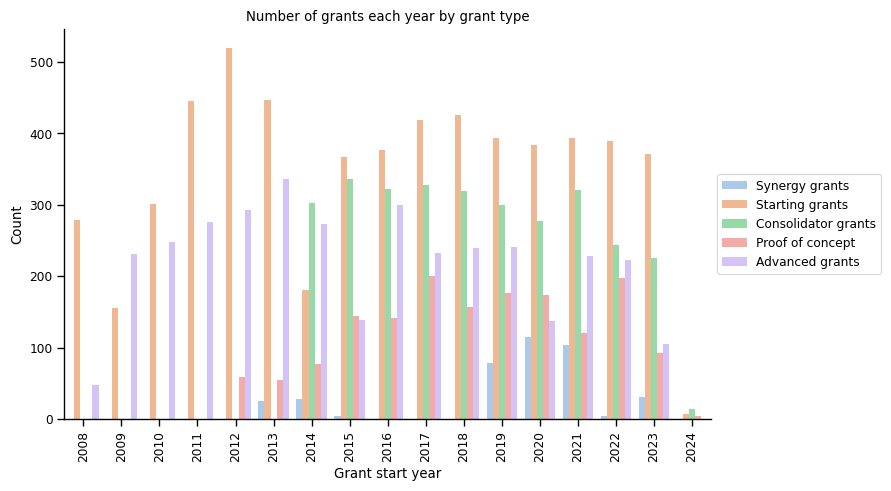

In [26]:
# Plot number of grants each year by grant type"
column = "start_year"
fig, ax = plt.subplots(figsize=(9, 5))
ax = sns.countplot(
    erc_full_df, x=column, hue="Grant type" ,order=np.sort(
        erc_full_df.loc[~erc_full_df[column].isna(), column].unique()
    ), ax=ax, palette="pastel"
)
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.title(f"Number of grants each year by grant type")
plt.xticks(rotation=90)
plt.ylabel("Count")
plt.xlabel("Grant start year")
sns.despine()
plt.tight_layout()
plt.show()

Let's visualize the grants budget each year by grant type:

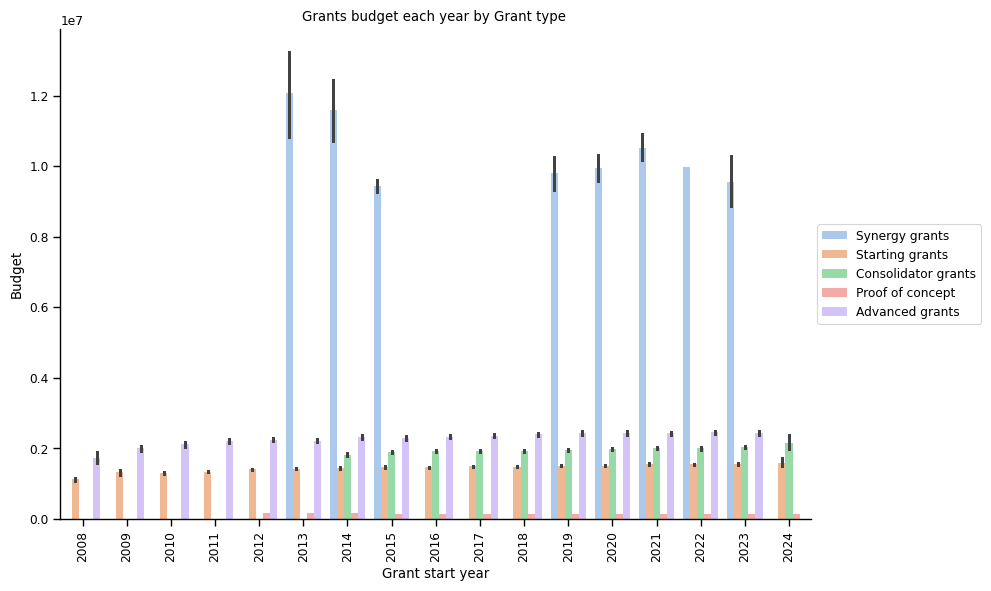

In [27]:
# Plot grants budget each year by grant type:
column = "start_year"
fig, ax = plt.subplots(figsize=(10, 6))
ax = sns.barplot(
    erc_full_df, x=column, y="Project budget", hue="Grant type" ,order=np.sort(
        erc_full_df.loc[~erc_full_df[column].isna(), column].unique()
    ), ax=ax, palette="pastel"
)
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.title(f"Grants budget each year by Grant type ")
plt.xticks(rotation=90)
plt.ylabel("Budget")
plt.xlabel("Grant start year")
sns.despine()
plt.tight_layout()
plt.show()

Let's visualize the number of projects per host institution:

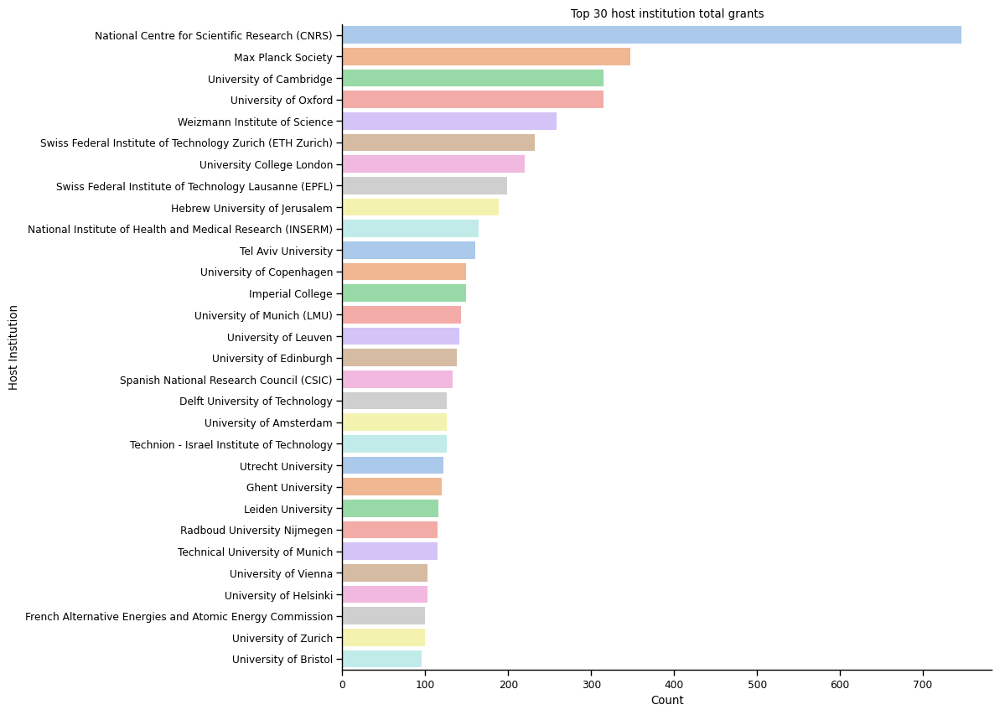

In [28]:
# Plot number of projects per host institution
column = "Host Institution"
top_k = 30
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.countplot(
    erc_full_df, y=column,
    order=erc_full_df.groupby(["Host Institution"]
                             ).size().sort_values(ascending=False
                                                 ).iloc[:top_k].index,
    palette="pastel"
)
plt.xlabel("Count")
sns.despine()
plt.title(f"Top {top_k} {column.lower()} total grants")
plt.show()

Let's visualize the grants budget by grant host institution:

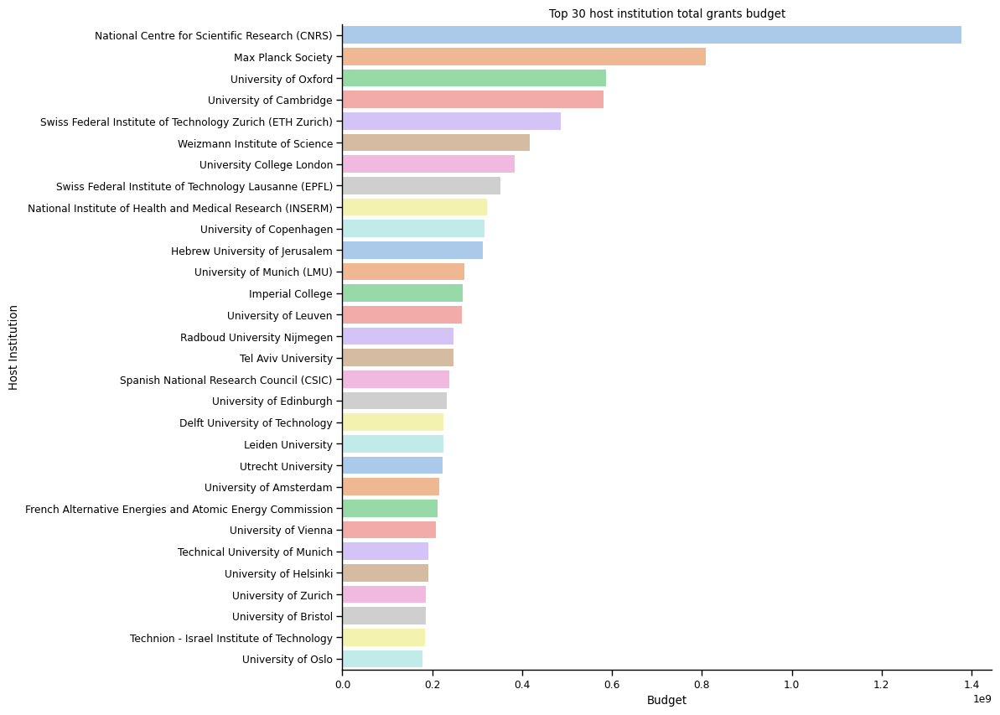

In [29]:
# Plot grants budget by grant host institution
column = "Host Institution"
top_k = 30
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.barplot(
    erc_full_df, y=column, x="Project budget", order=erc_full_df.groupby(
        [column]
    )["Project budget"].sum().sort_values(ascending=False).iloc[:top_k].index,
    palette="pastel", errorbar=None, estimator=sum
)
plt.xlabel("Budget")
sns.despine()
plt.title(f"Top {top_k} {column.lower()} total grants budget")
plt.show()

Let's visualize the grants budget by grant host institution each year:

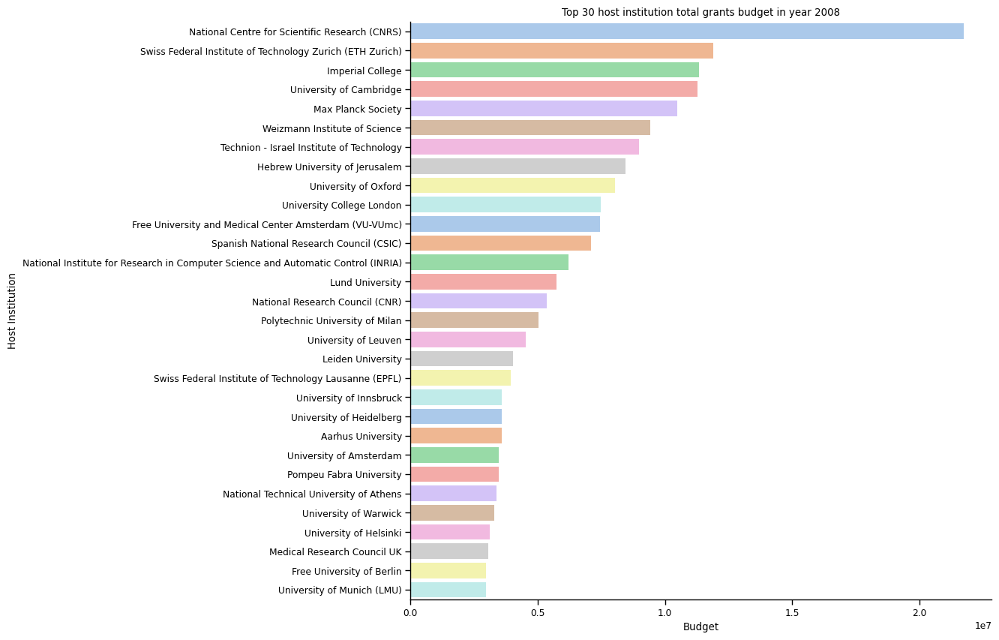

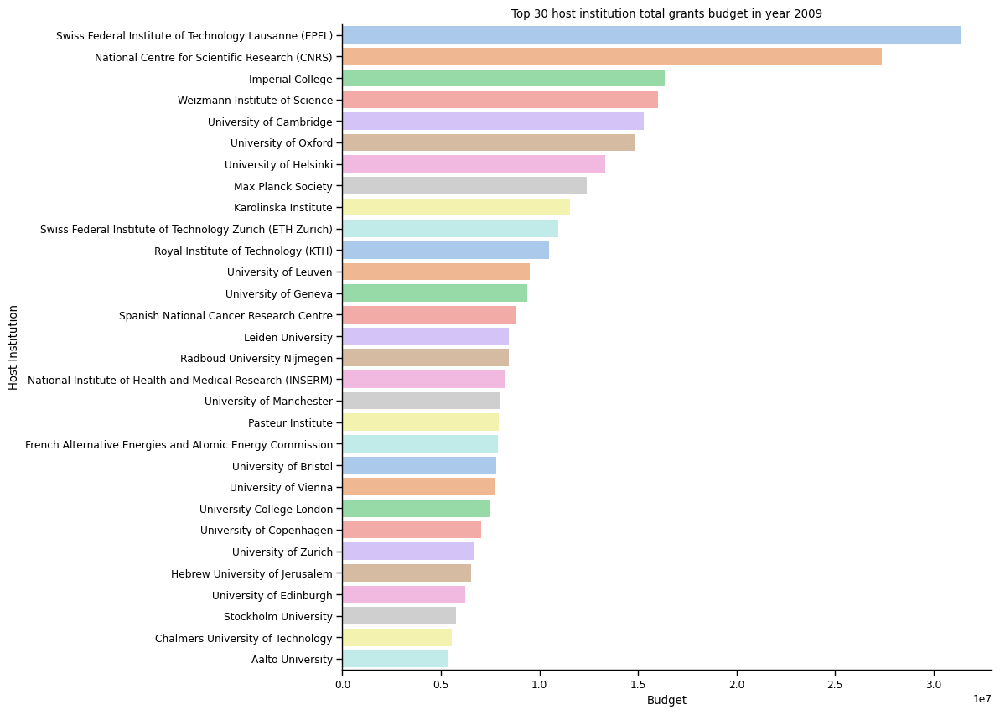

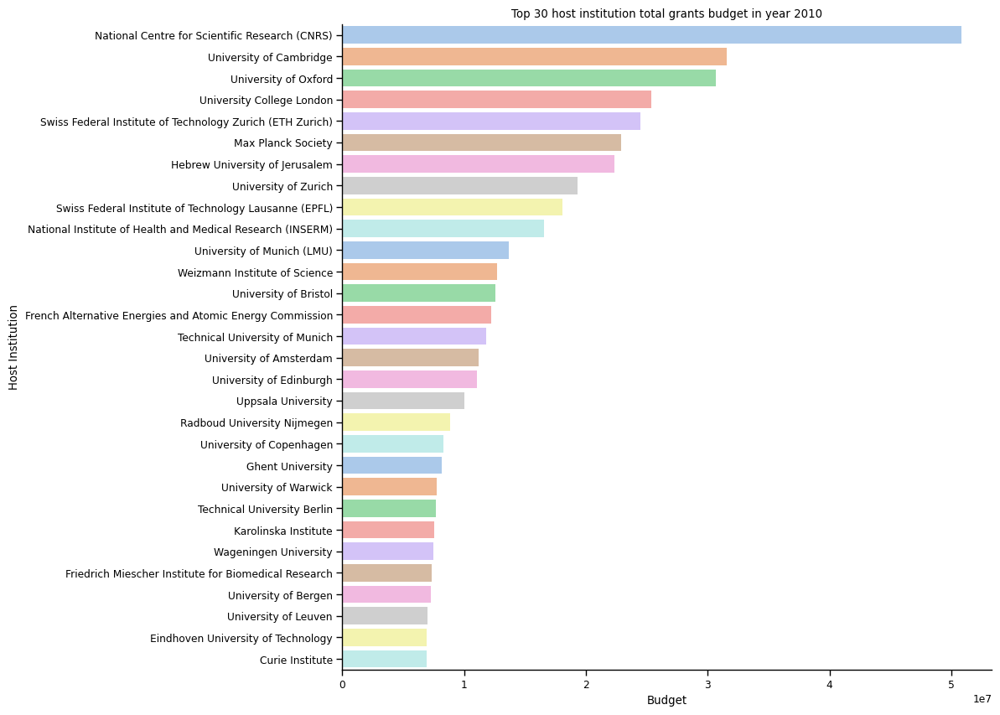

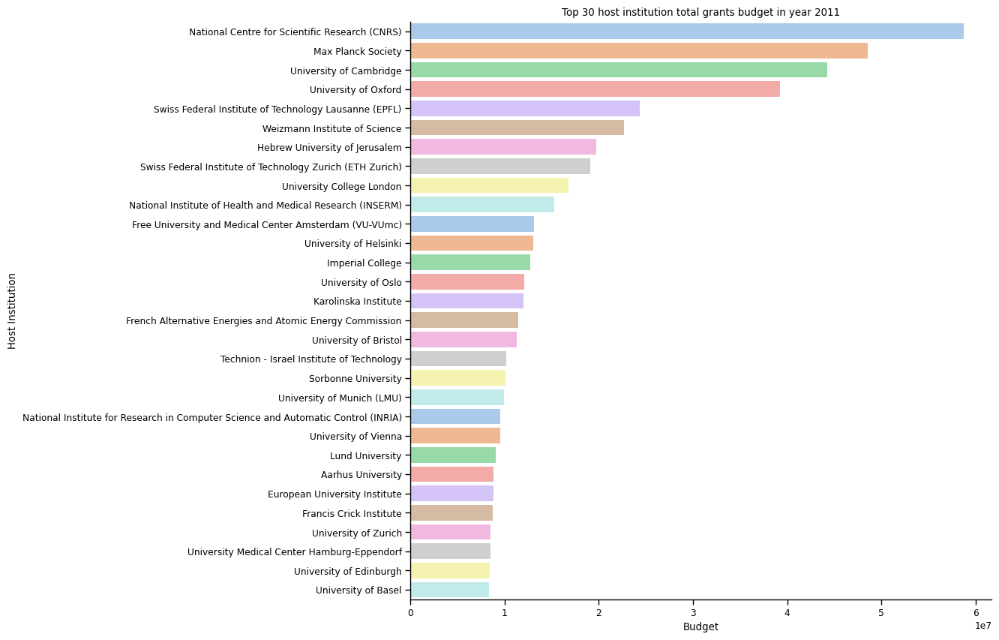

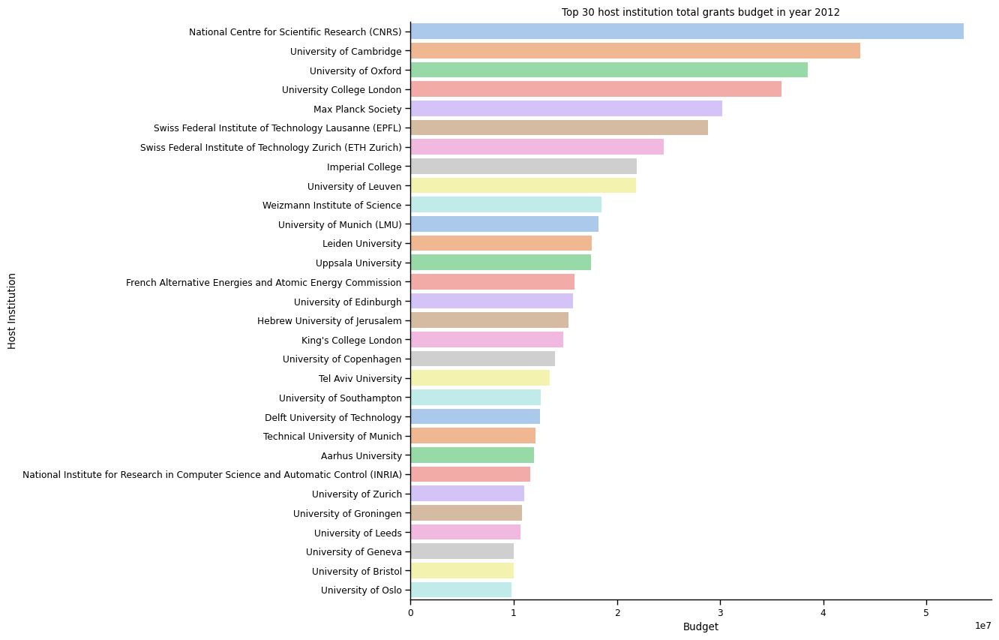

...

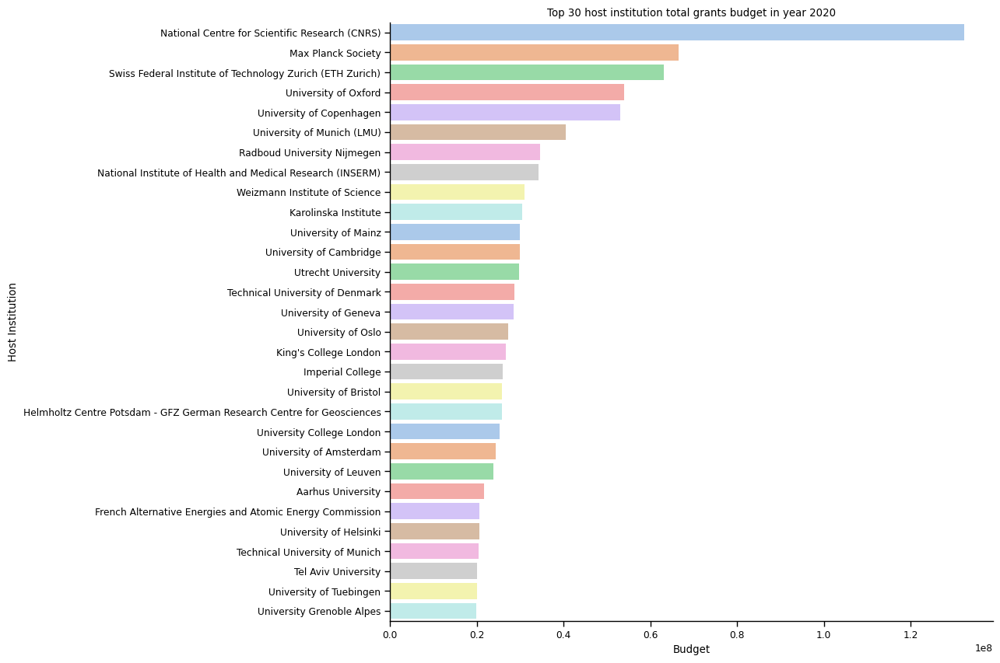

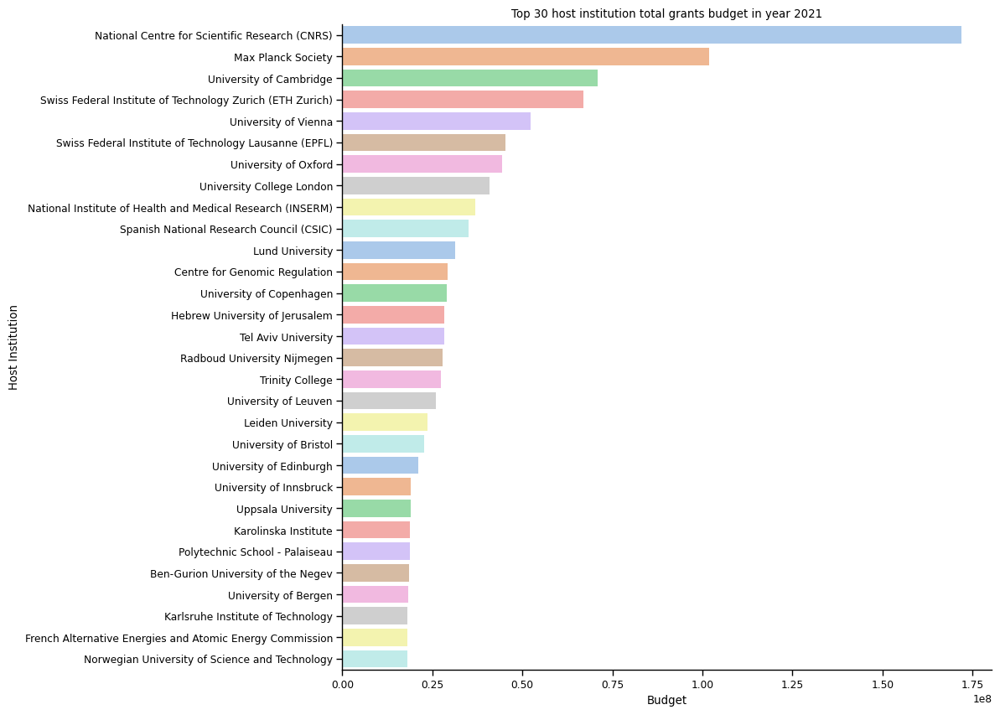

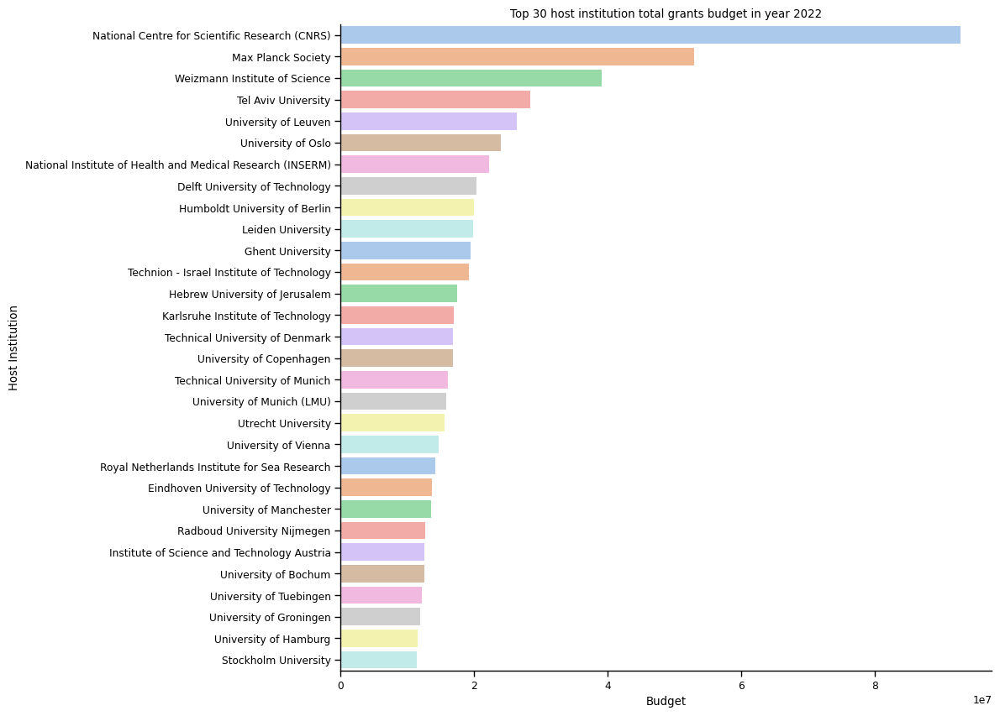

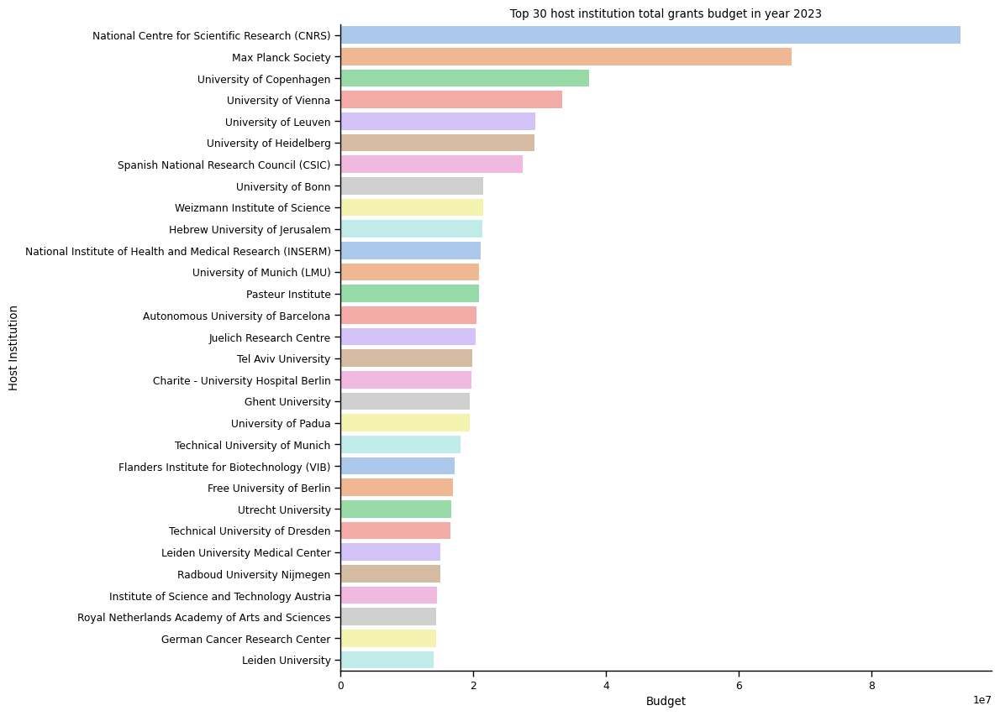

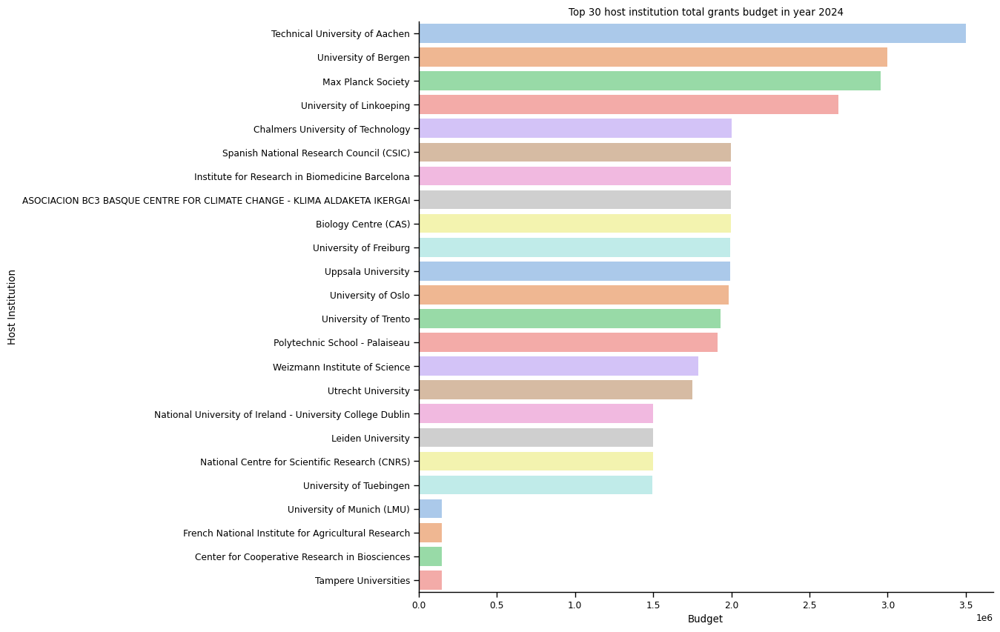

In [30]:
# Plot grants budget by grant host institution each year
for year in np.sort(erc_full_df["start_year"].unique()):
  loop_erc_full_df = erc_full_df[erc_full_df["start_year"] == year]
  column = "Host Institution"
  top_k = 30
  fig, ax = plt.subplots(figsize=(10, 10))
  ax = sns.barplot(
      loop_erc_full_df, y=column, x="Project budget",
      order=loop_erc_full_df.groupby(
          [column]
      )["Project budget"].sum().sort_values(ascending=False).iloc[:top_k].index,
      palette="pastel", errorbar=None, estimator=sum
  )
  plt.xlabel("Budget")
  sns.despine()
  plt.title(f"Top {top_k} {column.lower()} total grants budget in year {year}")
  plt.show()

Let's visualize the rants budget by grant topic:

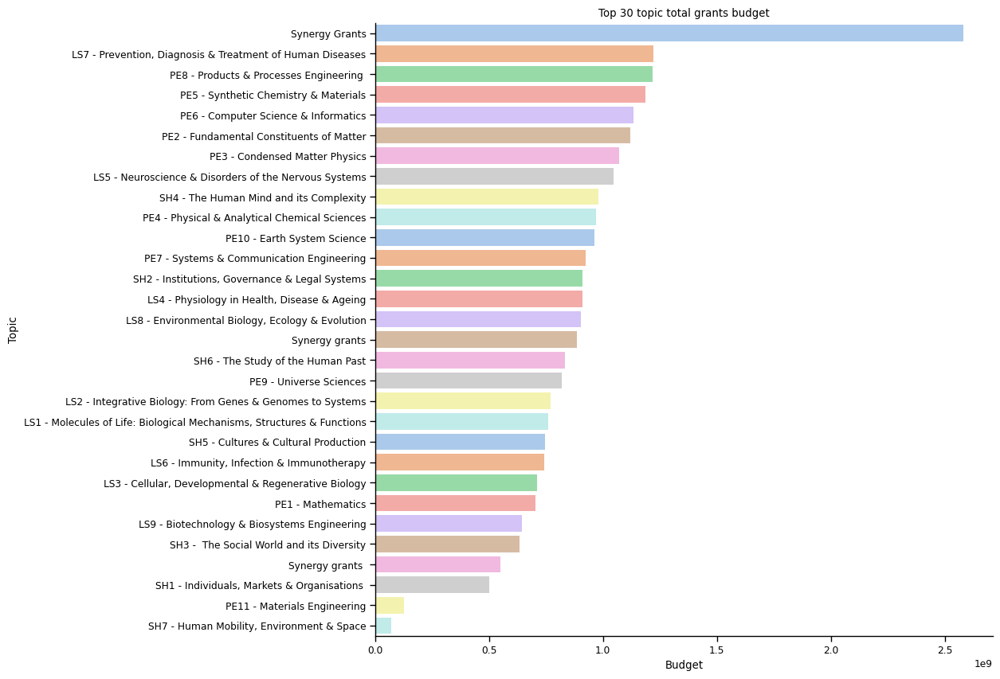

In [31]:
# Plot grants budget by grant topic
column = "Topic"
top_k = 30
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.barplot(
    erc_full_df,
    y=column, x="Project budget", order=erc_full_df.groupby(
        [column]
    )["Project budget"].sum().sort_values(ascending=False).iloc[:top_k].index,
    palette="pastel", errorbar=None, estimator=sum
)
plt.xlabel("Budget")
sns.despine()
plt.title(f"Top {top_k} {column.lower()} total grants budget")
plt.show()

Let's visualize the grants budget by grant topic each year:

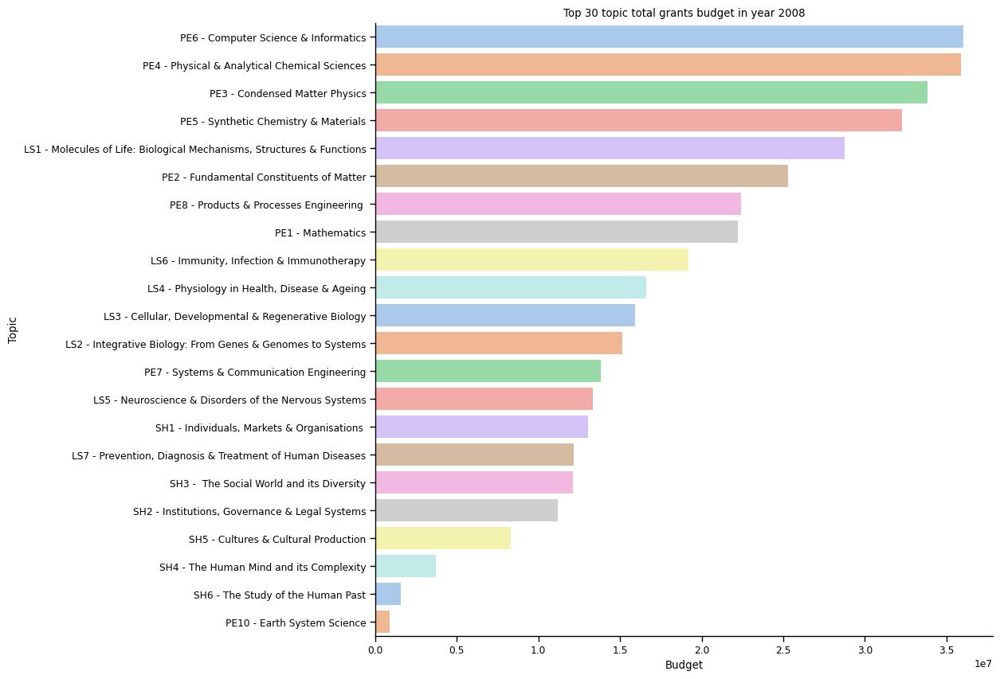

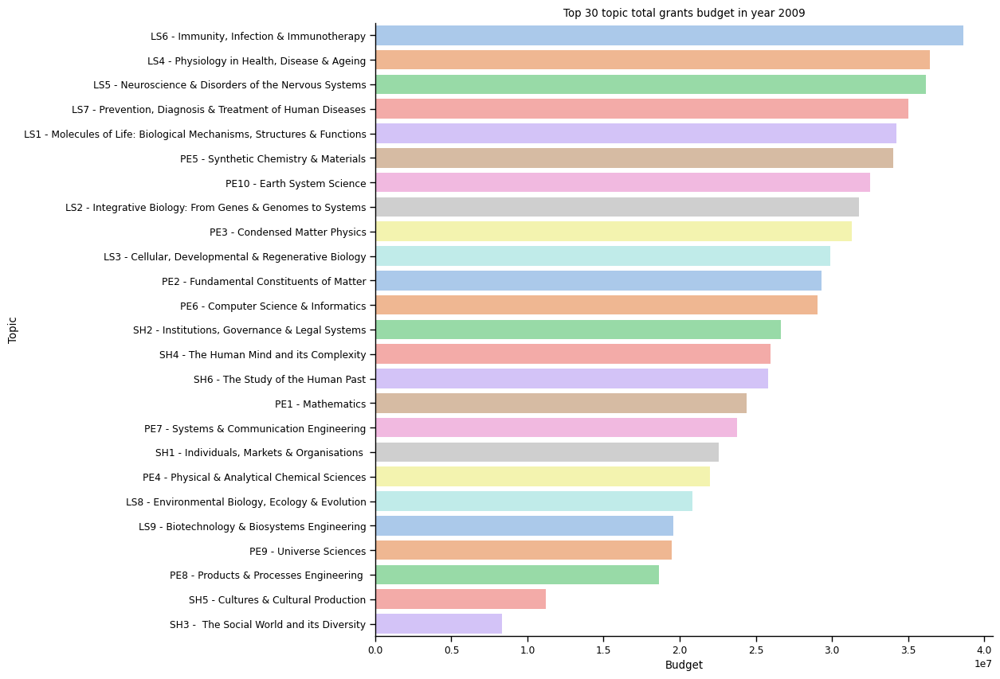

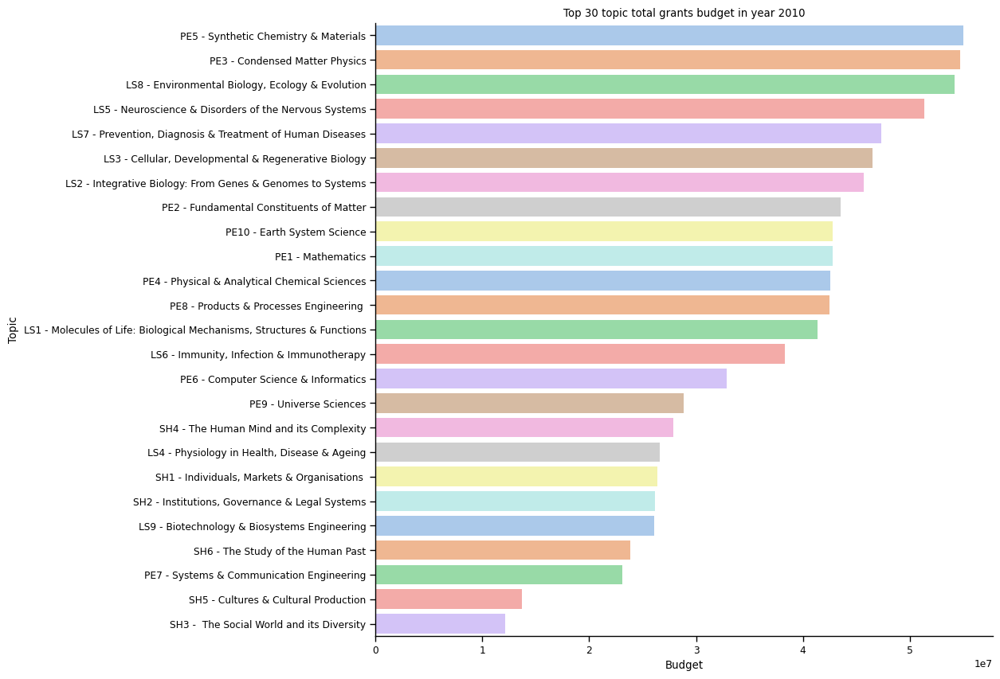

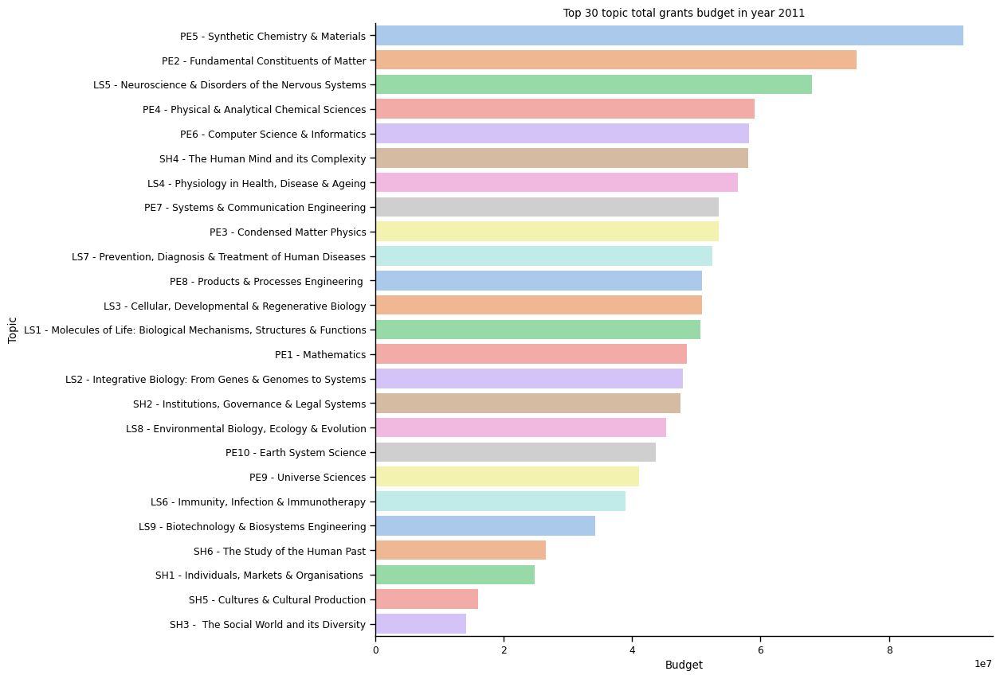

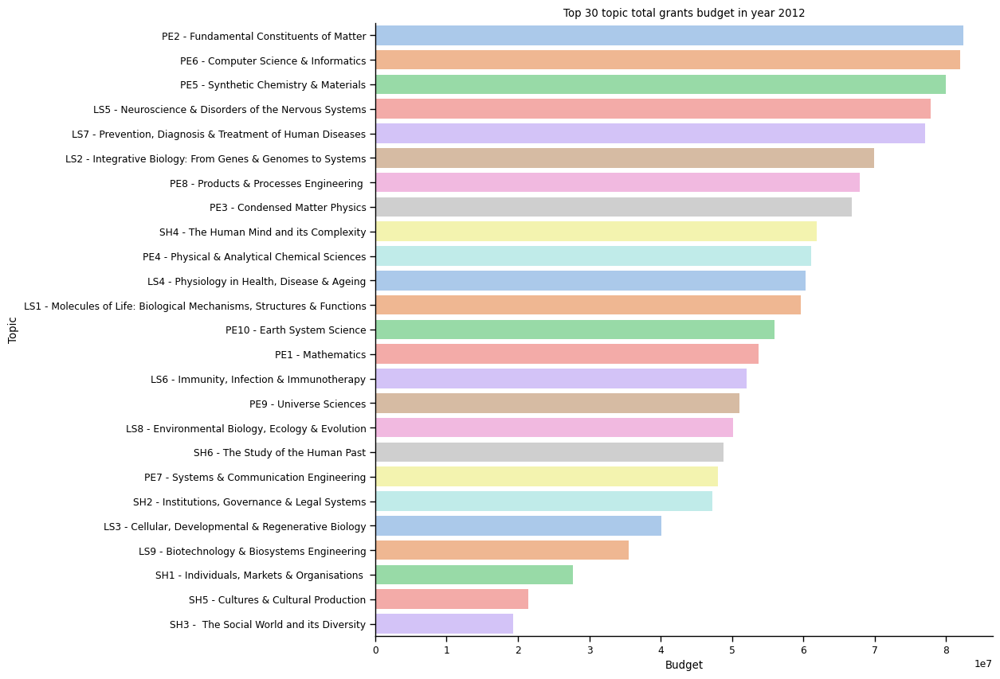

...

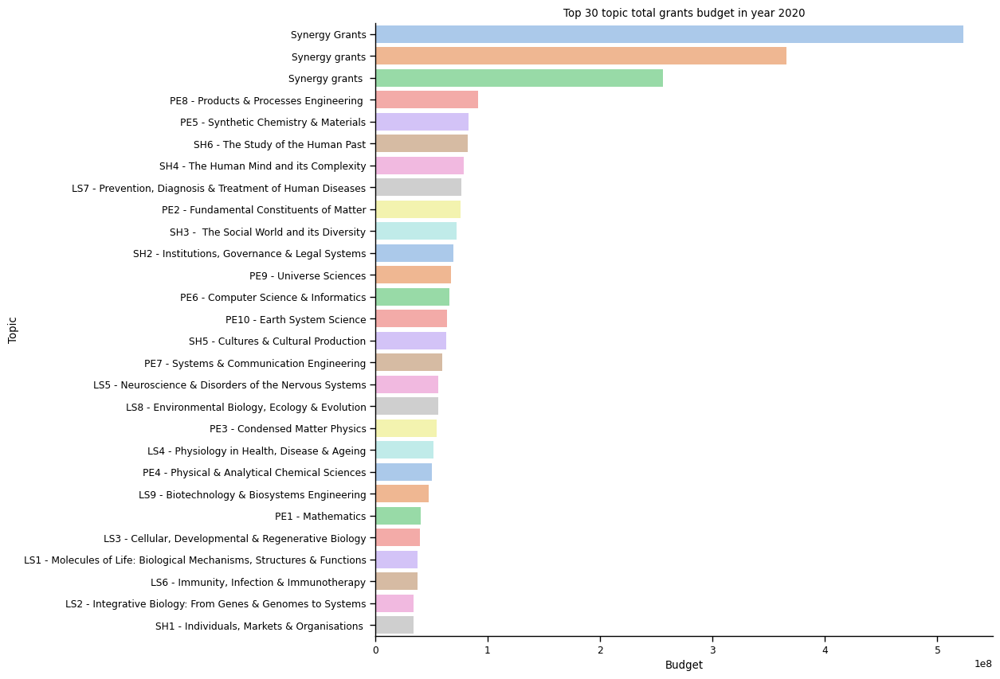

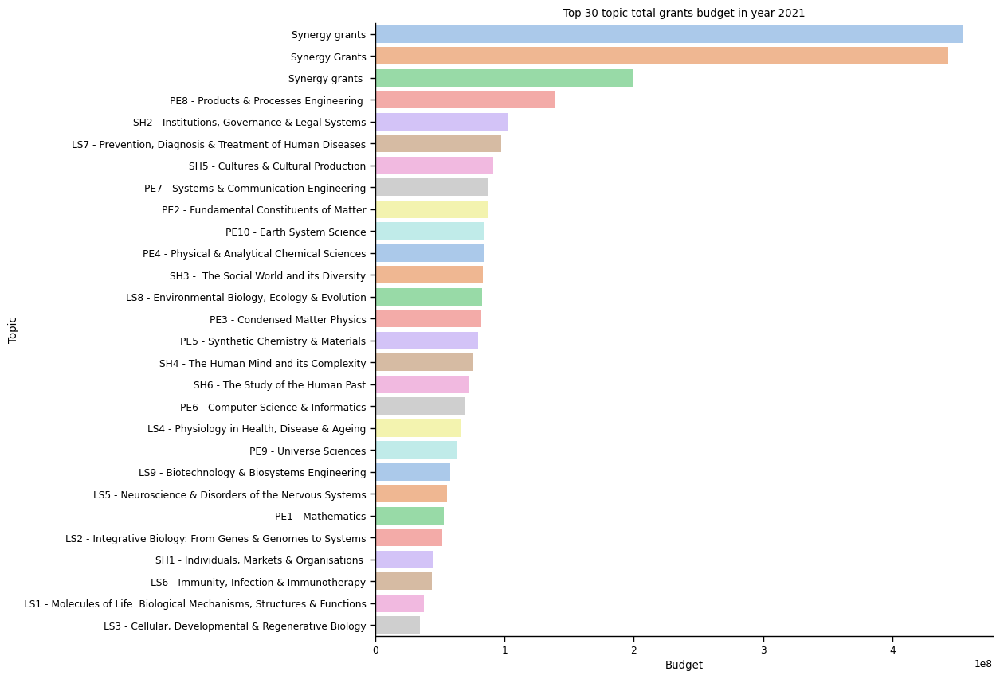

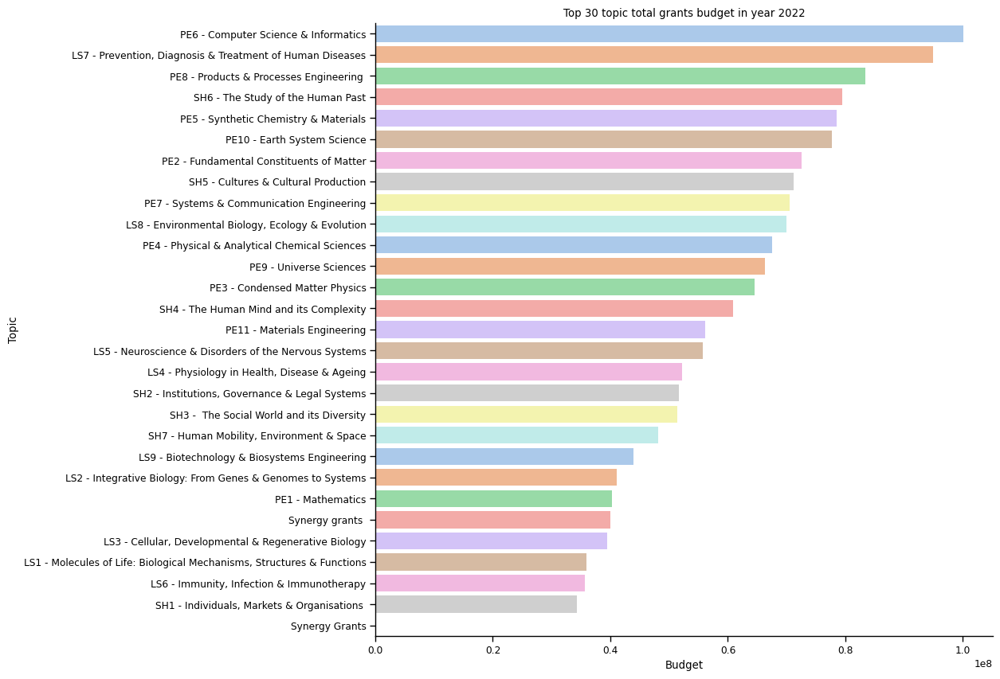

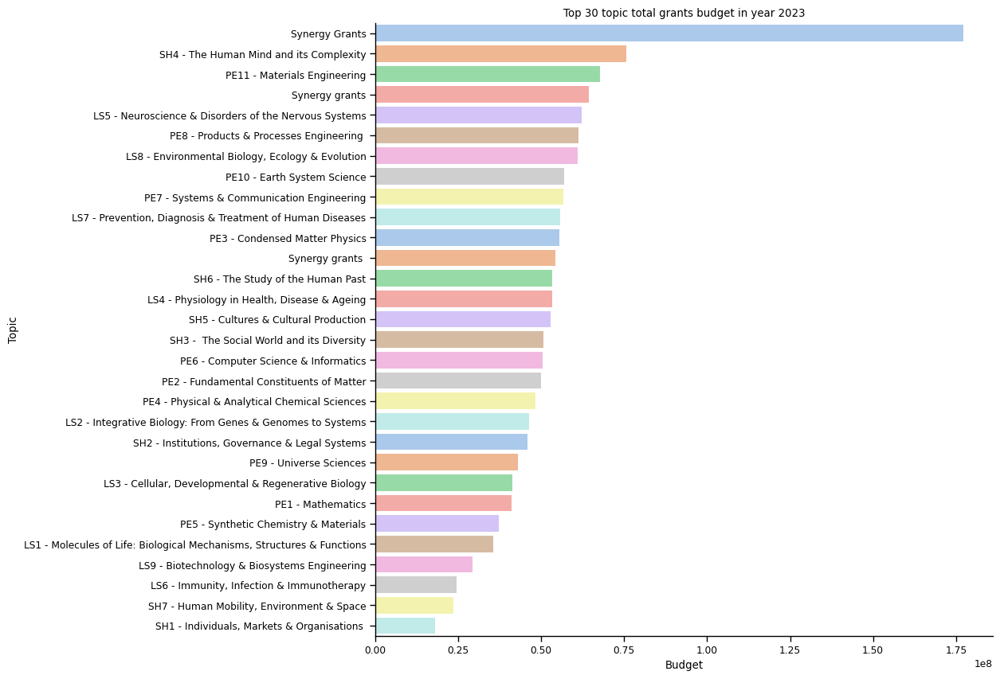

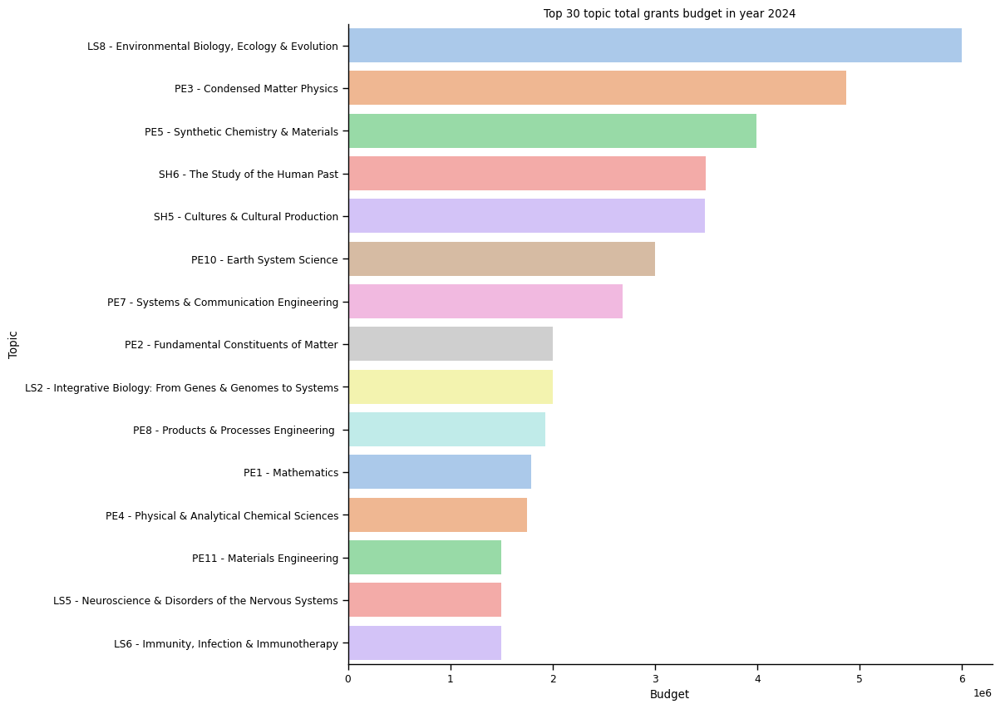

In [32]:
# Plot grants budget by grant topic each year
for year in np.sort(erc_full_df["start_year"].unique()):
  loop_erc_full_df = erc_full_df[erc_full_df["start_year"] == year]
  column = "Topic"
  top_k = 30
  fig, ax = plt.subplots(figsize=(10, 10))
  ax = sns.barplot(
      loop_erc_full_df, y=column, x="Project budget",
      order=loop_erc_full_df.groupby(
          [column]
      )["Project budget"].sum().sort_values(ascending=False).iloc[:top_k].index,
      palette="pastel", errorbar=None, estimator=sum
  )
  plt.xlabel("Budget")
  sns.despine()
  plt.title(f"Top {top_k} {column.lower()} total grants budget in year {year}")
  plt.show()

Let's visualize the grants budget by grant country:

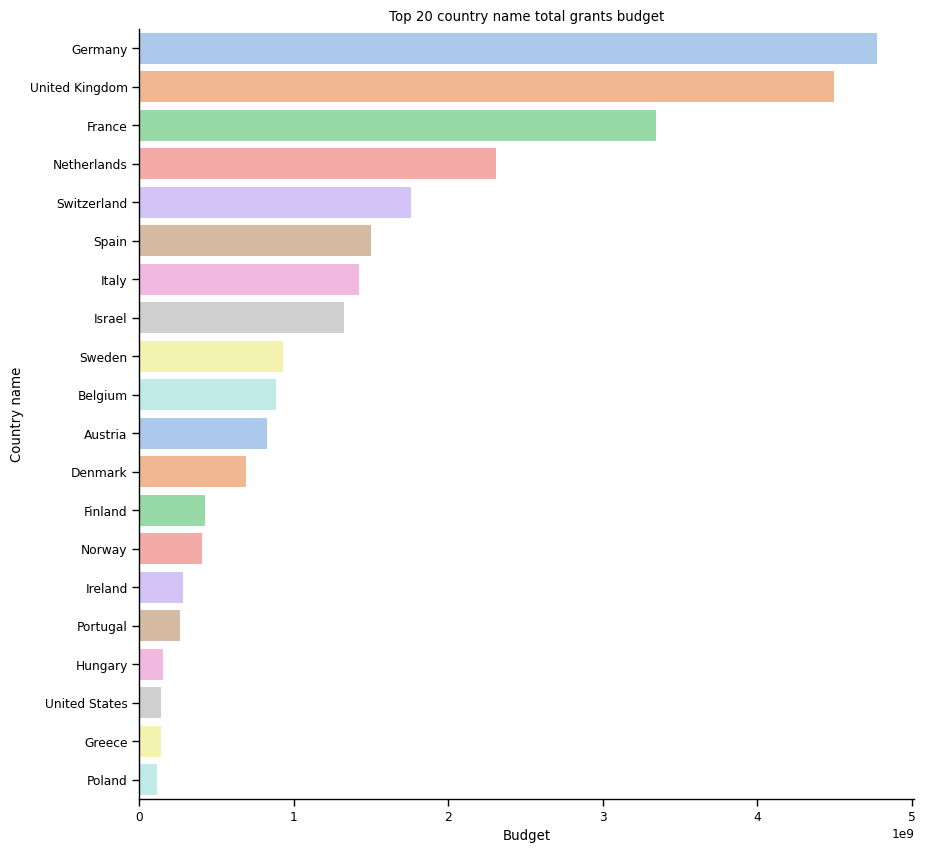

In [33]:
# Plot grants budget by grant country
column = "Country name"
top_k = 20
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.barplot(
    erc_full_df,
    y=column, x="Project budget", order=erc_full_df.groupby(
        [column]
    )["Project budget"].sum().sort_values(ascending=False).iloc[:top_k].index,
    palette="pastel", errorbar=None, estimator=sum
)
plt.xlabel("Budget")
sns.despine()
plt.title(f"Top {top_k} {column.lower()} total grants budget")
plt.show()

Let's visualize the grants budget by grant country each year:

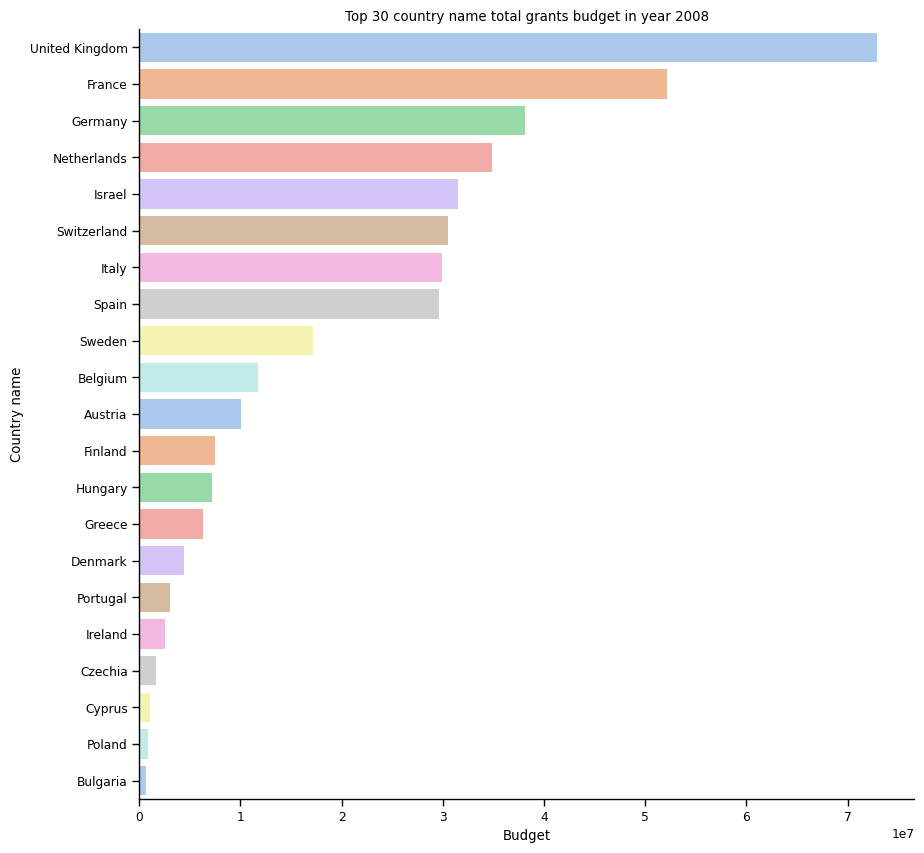

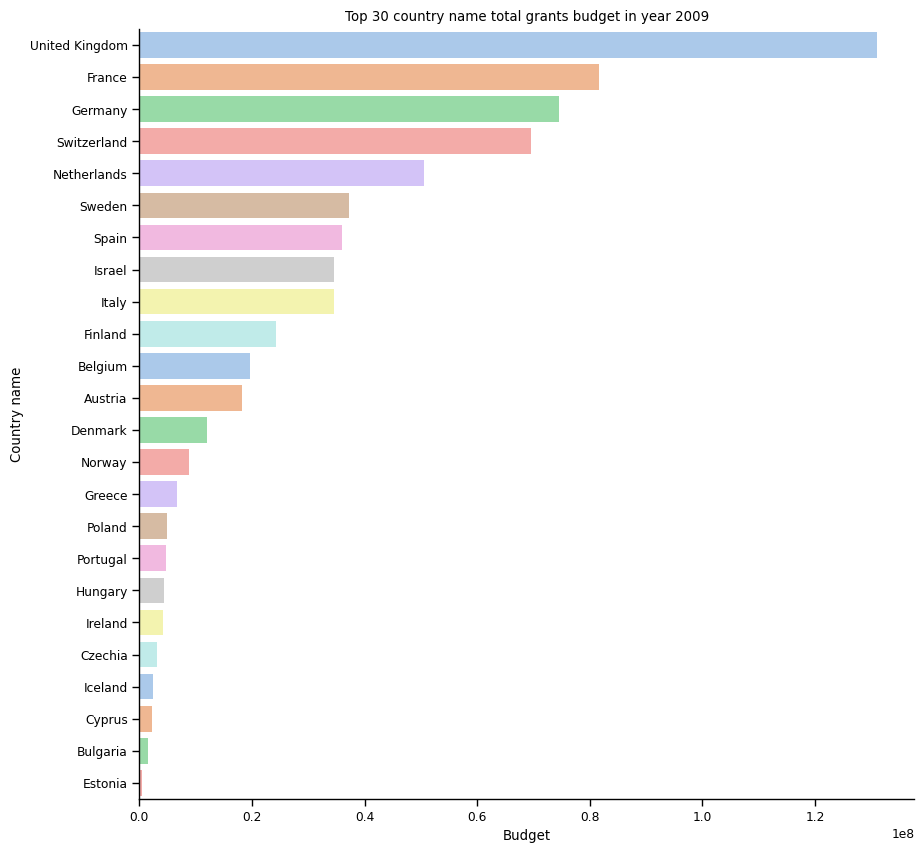

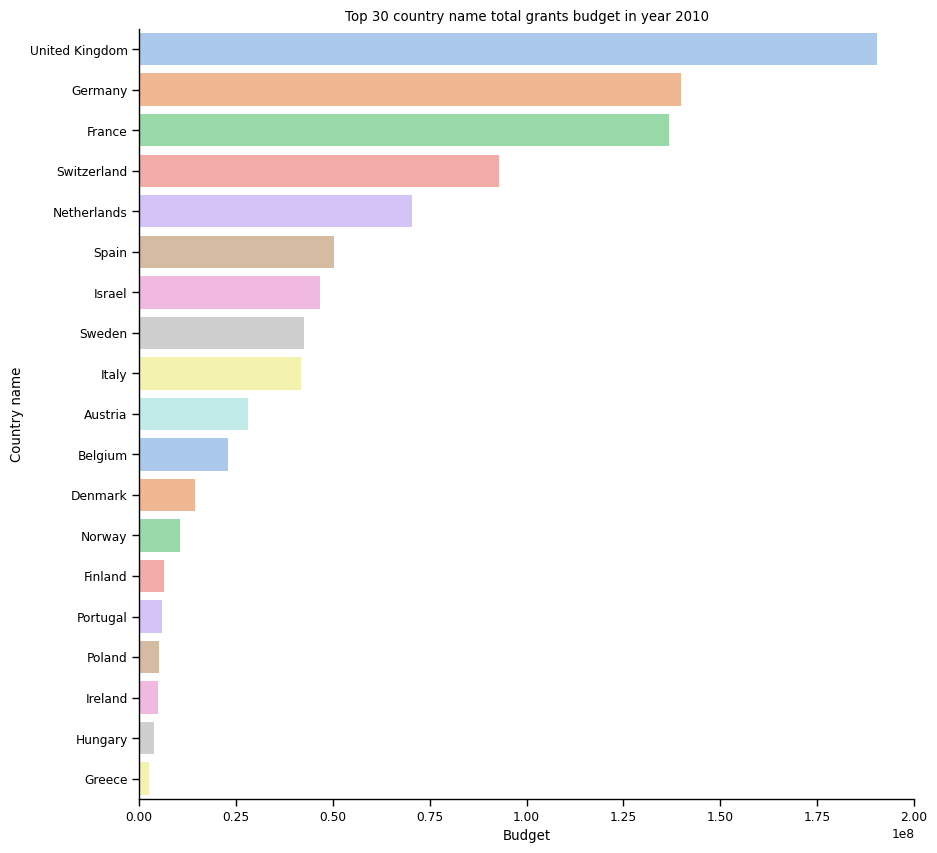

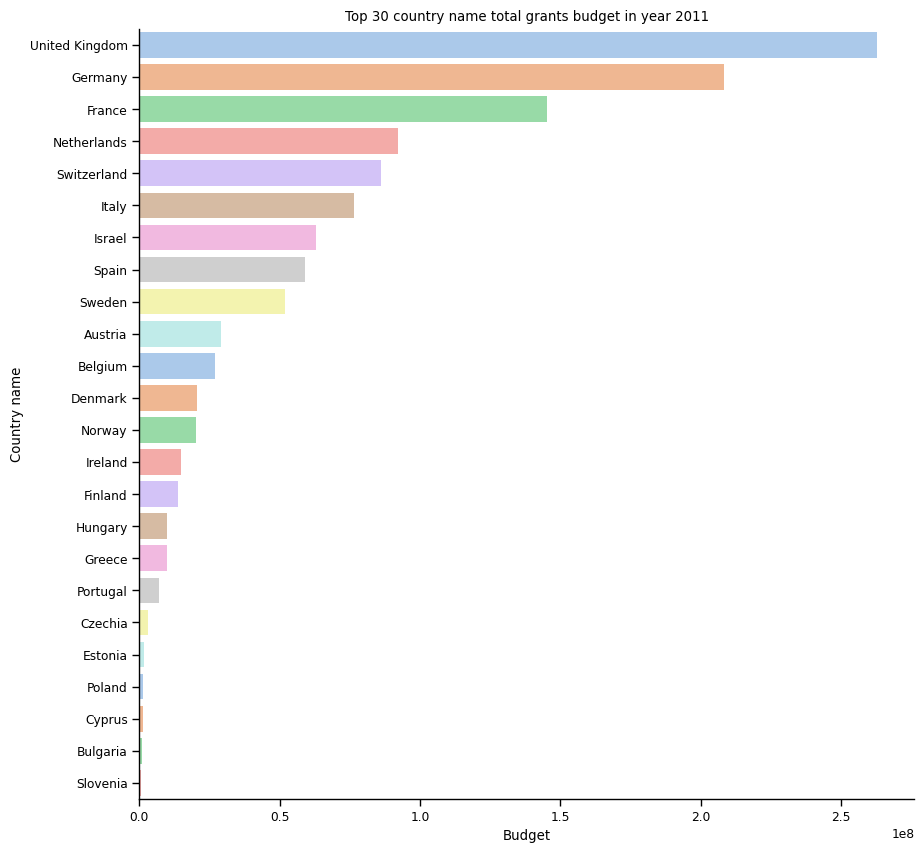

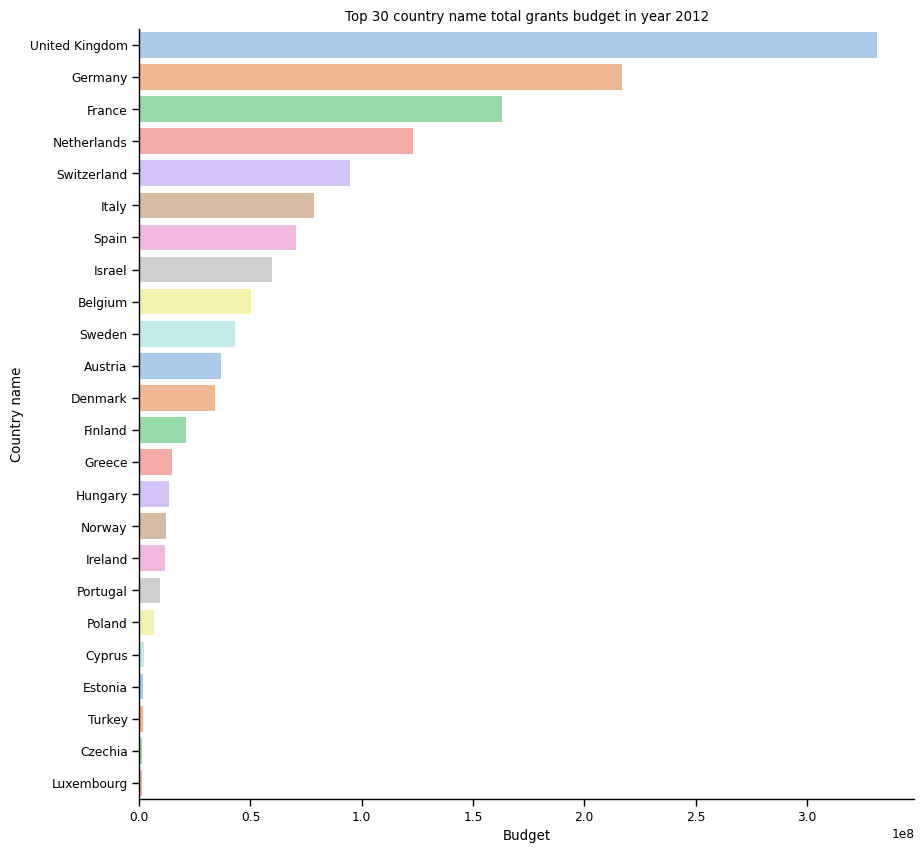

...

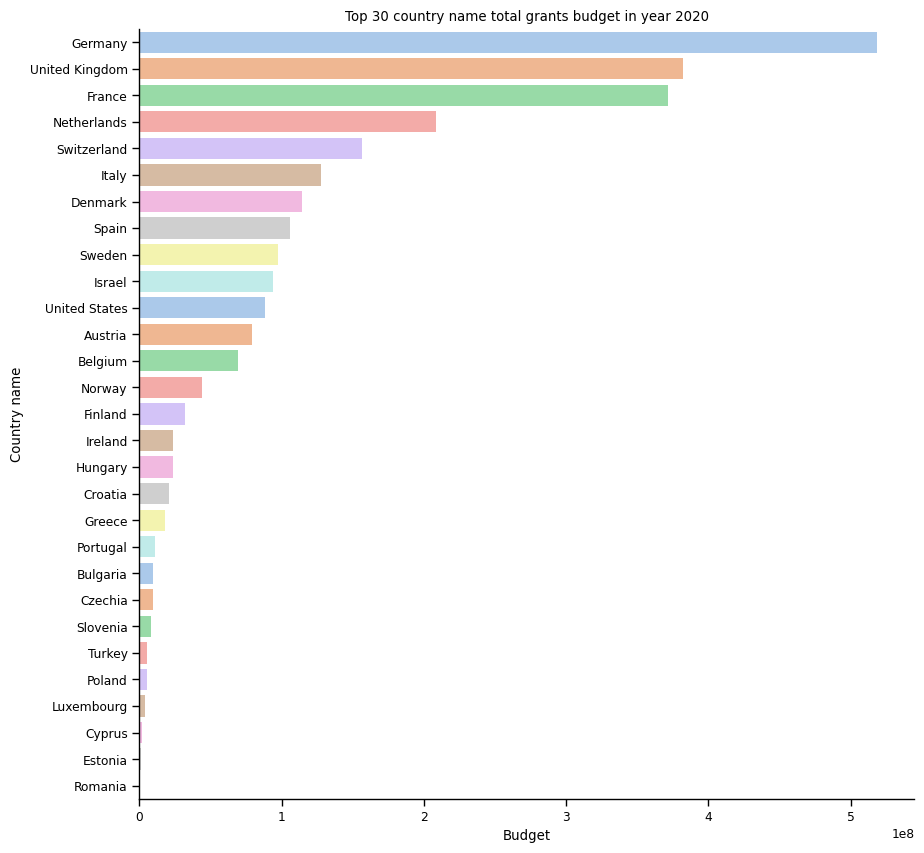

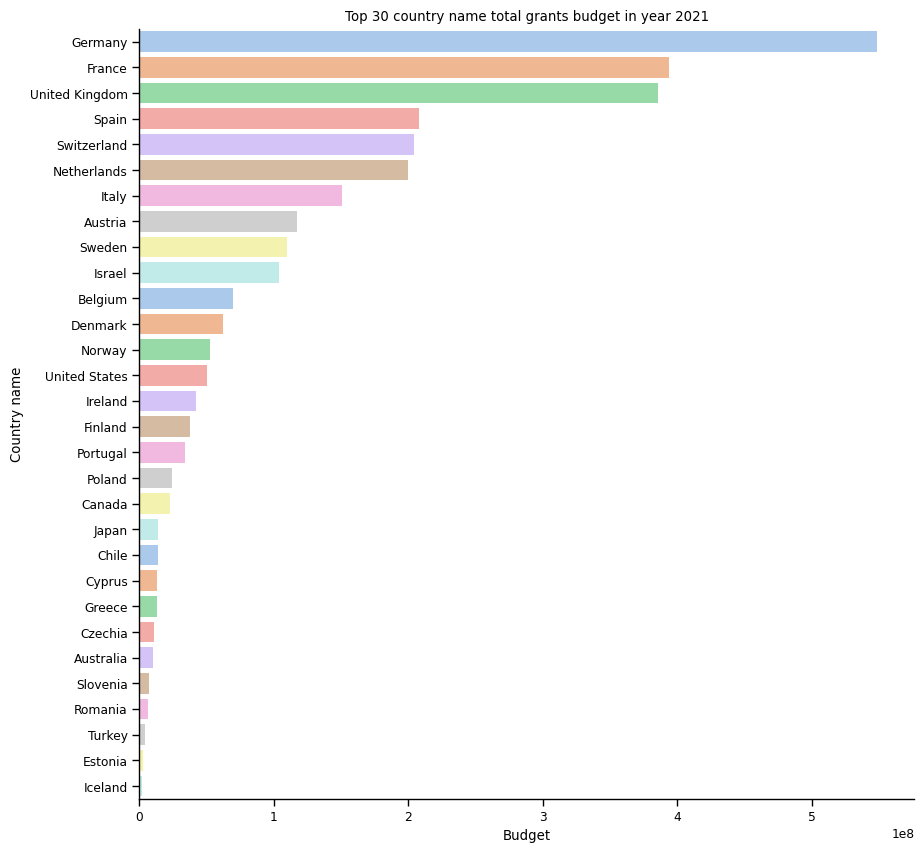

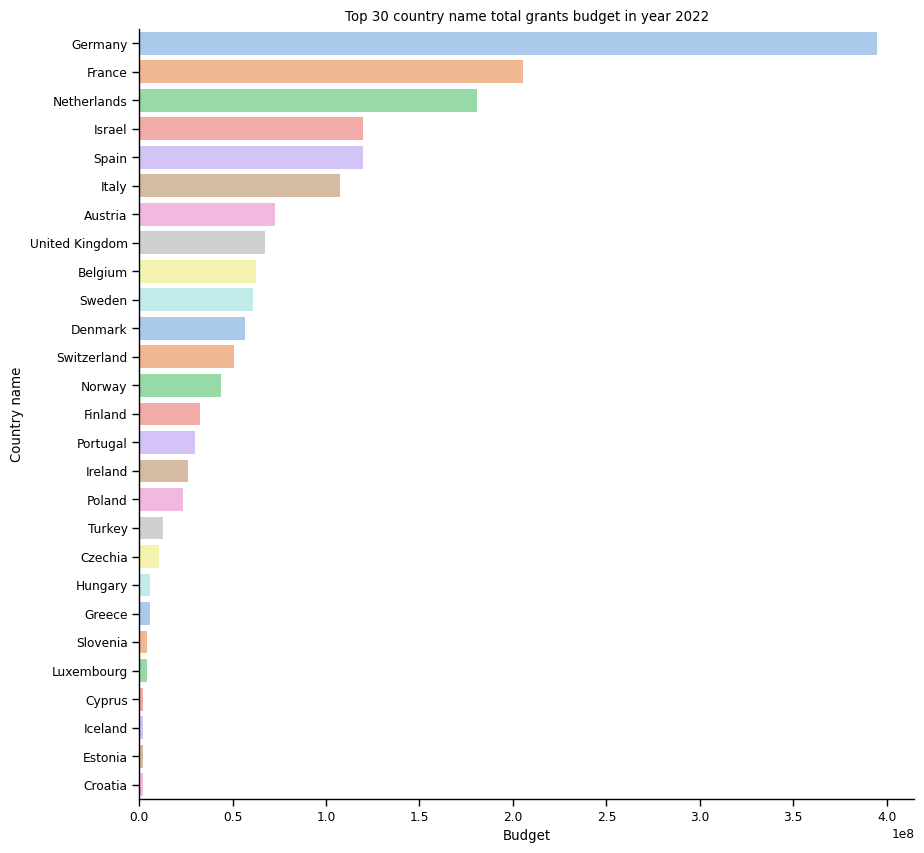

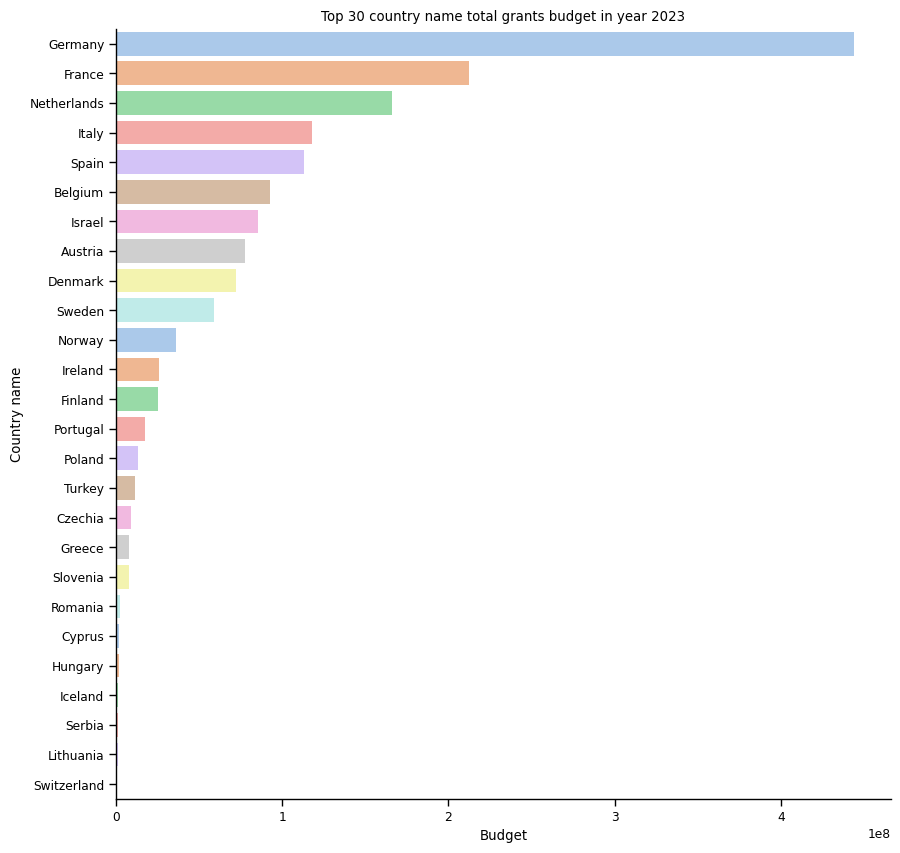

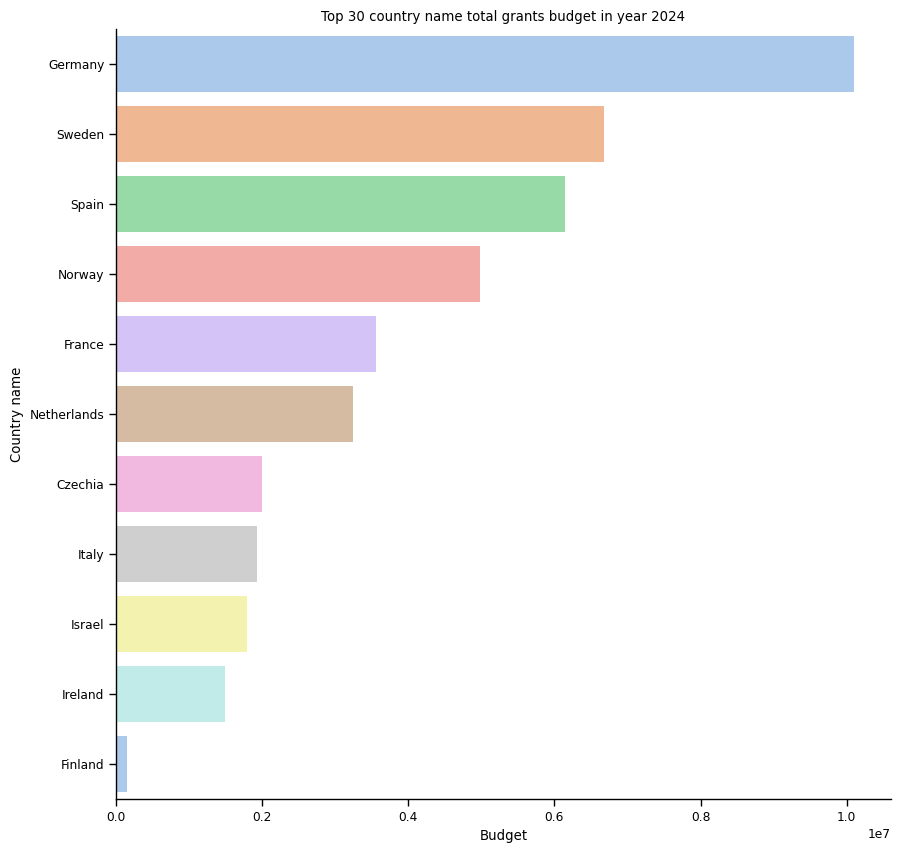

In [34]:
# Plot grants budget by grant country each year
for year in np.sort(erc_full_df["start_year"].unique()):
  loop_erc_full_df = erc_full_df[erc_full_df["start_year"] == year]
  column = "Country name"
  top_k = 30
  fig, ax = plt.subplots(figsize=(10, 10))
  ax = sns.barplot(
      loop_erc_full_df, y=column, x="Project budget",
      order=loop_erc_full_df.groupby(
          [column]
      )["Project budget"].sum().sort_values(ascending=False).iloc[:top_k].index,
      palette="pastel", errorbar=None, estimator=sum
  )
  plt.xlabel("Budget")
  sns.despine()
  plt.title(f"Top {top_k} {column.lower()} total grants budget in year {year}")
  plt.show()

Let's visualize the topic by grant type:

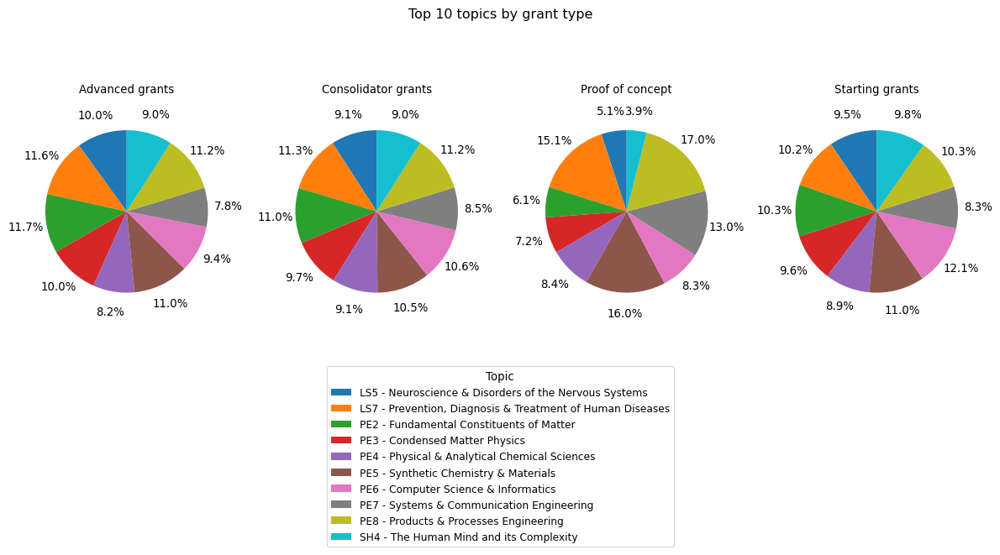

In [35]:
# Plot the topic by grant type
TOP_K=10
top_k_topic = erc_full_df.groupby("Topic")["Topic"].count().sort_values(ascending=False)[:TOP_K]
top_k_topic_l = top_k_topic.index.tolist()
top_k_topic_df = erc_full_df[erc_full_df["Topic"].isin(top_k_topic_l)]

grouped = top_k_topic_df.groupby(["Grant type", "Topic"]).size().unstack()
num_types = grouped.shape[0]
fig, axs = plt.subplots(1, num_types, figsize=(12, 6), sharey=True)

for i, type_ in enumerate(grouped.index):
    data = grouped.loc[type_].dropna()
    wedges, text_autopct, _ = axs[i].pie(data, labels=None, startangle=90, autopct="%1.1f%%", pctdistance=1.25)
    axs[i].set_title(type_, pad=15)

fig.suptitle(f"Top {TOP_K} topics by grant type")
fig.legend(wedges, grouped.columns, title="Topic", loc="lower center", bbox_to_anchor=(0.5, -0.1))
plt.tight_layout(rect=[0, -0.1, 1, 1.3])
plt.show()

Let's visualize the host institution by grant type:

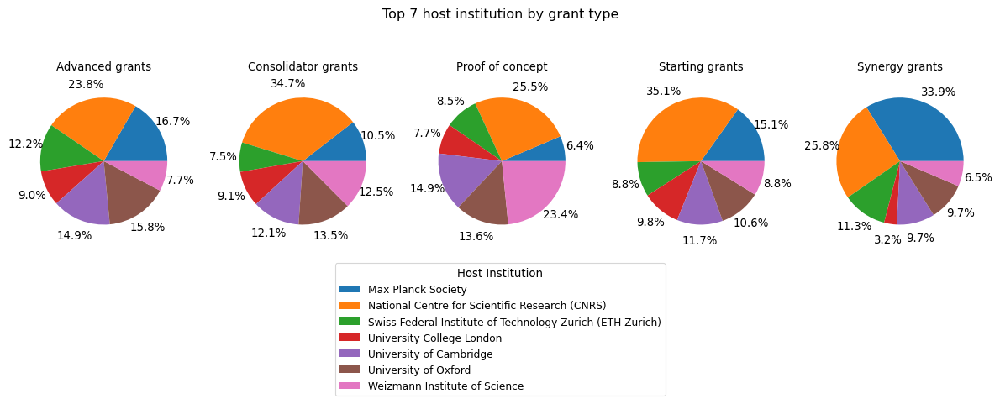

In [36]:
# Plot the host institution by grant type
TOP_K=7
column = "Host Institution"
top_k_topic = erc_full_df.groupby(column)[column].count().sort_values(ascending=False)[:TOP_K]
top_k_topic_l = top_k_topic.index.tolist()
top_k_topic_df = erc_full_df[erc_full_df[column].isin(top_k_topic_l)]

grouped = top_k_topic_df.groupby(["Grant type", column]).size().unstack()
num_types = grouped.shape[0]
fig, axs = plt.subplots(1, num_types, figsize=(12, 6), sharey=True)

for i, type_ in enumerate(grouped.index):
    data = grouped.loc[type_].dropna()
    wedges, text_autopct, _ = axs[i].pie(data, labels=None, startangle=0, autopct="%1.1f%%", pctdistance=1.25)
    axs[i].set_title(type_, pad=10)

fig.suptitle(f"Top {TOP_K} host institution by grant type")
fig.legend(wedges, grouped.columns, title=column, loc="lower center", bbox_to_anchor=(0.5, 0.2))
plt.tight_layout(rect=[0, -0.1, 1, 1.5])
plt.show()

Let's visualize the Country by grant type:

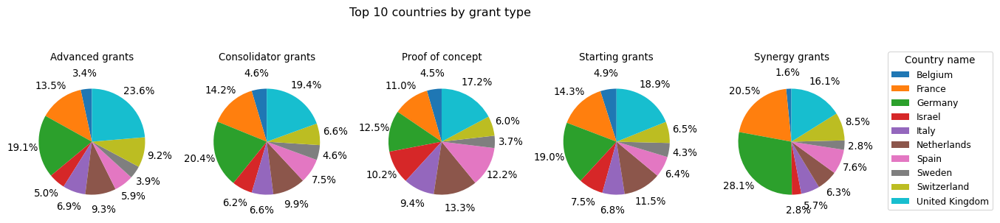

In [37]:
# Plot the countries by grant type
TOP_K=10
column = "Country name"
top_k_topic = erc_full_df.groupby(column)[column].count().sort_values(ascending=False)[:TOP_K]
top_k_topic_l = top_k_topic.index.tolist()
top_k_topic_df = erc_full_df[erc_full_df[column].isin(top_k_topic_l)]

grouped = top_k_topic_df.groupby(["Grant type", column]).size().unstack()
num_types = grouped.shape[0]
fig, axs = plt.subplots(1, num_types, figsize=(12, 6), sharey=True)

for i, type_ in enumerate(grouped.index):
    data = grouped.loc[type_].dropna()
    wedges, text_autopct, _ = axs[i].pie(data, labels=None, startangle=90, autopct="%1.1f%%", pctdistance=1.3)
    axs[i].set_title(type_, pad=15)

fig.suptitle(f"Top {TOP_K} countries by grant type")
fig.legend(wedges, grouped.columns, title=column, loc="center left", bbox_to_anchor=(1, 0.7))
plt.tight_layout(rect=[0, -0.1, 1, 1.5])
plt.show()

## ***Network analysis***

Let's create a graph of all the collaboration in the ERC:

In [38]:
# Create graph of collaboration projects
collaboration_projects_ids = erc_full_df[
    erc_full_df.duplicated(subset="Project number",
                           keep=False)]["Project number"].unique()
projects_id_2_Institution = {}
for idx, projects_id in enumerate(collaboration_projects_ids):
  curr_df = erc_full_df[erc_full_df["Project number"].isin([projects_id])]
  projects_id_2_Institution[projects_id] = curr_df["Host Institution"].to_list()
collaboration_institutions_l = []
for project_id, institutions in projects_id_2_Institution.items():
  combinations_list = list(combinations(institutions, 2))
  {
      collaboration_institutions_l.extend(
          [
              dict(institution_1=institution_1, institution_2=institution_2),
          ]
      ) for institution_1, institution_2 in combinations_list
  }
G = nx.Graph()
for edge_dict in collaboration_institutions_l:
  source = edge_dict["institution_1"]
  target = edge_dict["institution_2"]
  value = 1

  if G.has_edge(source, target):
    current_weight = G[source][target]["weight"]
    G[source][target]["weight"] = current_weight + value
  elif G.has_edge(target, source):
    current_weight = G[target][source]["weight"]
    G[target][source]["weight"] = current_weight + value
  else:
    G.add_edge(source, target, weight=value)
plt.figure(figsize=(100, 100))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos)
nx.draw_networkx_labels(G, pos)
nx.draw_networkx_edges(G, pos)
plt.axis("off")
plt.title("Graph of collaboration projects")
plt.show()

Let's visualize the number of PI's in a collaboration:

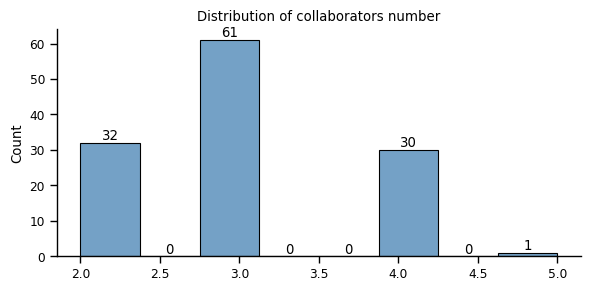

In [39]:
# Plot number of PI's in a collaboration:
fig, ax = plt.subplots(figsize=(6, 3))
ax = sns.histplot(
    [len(d) for d in list(projects_id_2_Institution.values())],
    ax=ax, color="steelblue"
)
ax.bar_label(ax.containers[0])
plt.title("Distribution of collaborators number")
sns.despine()
plt.tight_layout()
plt.show()

Let's get all cliques in the graph:

In [40]:
# Find all cliques in the graph
cliques = list(nx.find_cliques(G))
sorted_cliques = sorted(cliques, key=len, reverse=True)
for clique in sorted_cliques:
    print(clique)

['University Grenoble Alpes', 'Radboud University Nijmegen', 'Maastricht University', 'University of Paris 7 - Diderot', 'UNIVERSITE PARIS 13']
['University of Adelaide', 'University of Messina', 'University of Antwerp', 'University of Warwick']
['Vienna University of Technology', 'University of Munich (LMU)', 'University of Delaware', 'National Metrology Institute of Germany (PTB)']
['Karolinska Institute', 'Harvard University', 'Curie Institute', 'University of Medicine Vienna']
['Complutense University of Madrid', 'National Centre for Scientific Research (CNRS)', 'University College London', 'Centre for Genomic Regulation']
['University of Kent', 'Bulgarian Academy of Sciences', 'Charite - University Hospital Berlin', 'Central European University']
['University of Kent', "University of Naples L'Orientale", 'Spanish National Research Council (CSIC)', 'University of Nantes']
['Institute of Advanced Scientific Studies (IHES)', 'Aarhus University', 'French Alternative Energies and Atomi

Let's visualize first clique:

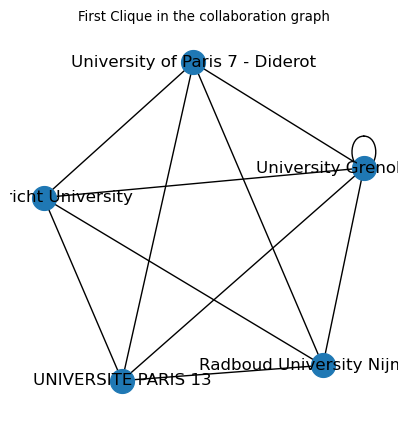

In [41]:
# Plot first clique
first_clique = sorted_cliques[0]
subgraph = G.subgraph(first_clique)
plt.figure(figsize=(5, 5))
pos = nx.spring_layout(subgraph)

nx.draw_networkx_nodes(subgraph, pos)
nx.draw_networkx_edges(subgraph, pos)
nx.draw_networkx_labels(subgraph, pos)

plt.axis("off")
plt.title("First Clique in the collaboration graph")
plt.show()


Let's visualize graph with communities:

In [42]:
# Plot graph with communities
communities = nx.algorithms.community.greedy_modularity_communities(G)
communities_dict = {}
for i, community in enumerate(communities):
  for node in community:
    communities_dict[node] = i

unique_communities = set(communities_dict.values())
pos = nx.spring_layout(G)
plt.figure(figsize=(100, 100))

for community_id in unique_communities:
  nodes_in_community = [
      node for node, comm_id in communities_dict.items()
      if comm_id == community_id
  ]
  nx.draw_networkx_nodes(
      G, pos, nodelist=nodes_in_community, node_color=f'C{community_id}',
      label=f'Community {community_id}'
  )
  nx.draw_networkx_labels(
      G, pos, labels={node: node for node in nodes_in_community}
  )

nx.draw_networkx_edges(G, pos)
plt.axis('off')
plt.title('Graph with Communities')
plt.legend()
plt.show()

## ***Geographical analysis***

In [43]:
curr_col = 'Country name'
date_column = 'start_year'
CRITIRA_VALUE = 'Project budget' # Project budget/cumulative_sum

erc_full_df.sort_values(by=[curr_col, date_column], ascending=[True,True])
grouped_budget_df = erc_full_df.groupby([curr_col, date_column])['Project budget'].sum().reset_index()
grouped_budget_df['cumulative_sum'] = grouped_budget_df.groupby(curr_col)['Project budget'].cumsum()

print(grouped_budget_df.head(10))

# map plot
min_range_color = 0 # int(grouped_meteorite_df[CRITIRA_VALUE].min())
max_range_color = int(grouped_budget_df[CRITIRA_VALUE].max())

from_year = int(grouped_budget_df[date_column].min())
to_year = int(grouped_budget_df[date_column].max())

title=f"Country's cumulative budget from {from_year} to {to_year} W animation_frame"
print(title)
print()

fig = px.choropleth(grouped_budget_df, locations=curr_col,locationmode='country names',
                    color=f'{CRITIRA_VALUE}',
                    animation_frame=date_column,
                    color_continuous_scale='Reds',
                    range_color=(min_range_color, max_range_color),
                    title=title
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

  Country name  start_year  Project budget  cumulative_sum
0    Australia        2019      10400695.0      10400695.0
1    Australia        2021       9999892.0      20400588.0
2      Austria        2008      10088797.0      10088797.0
3      Austria        2009      18225044.0      28313840.0
4      Austria        2010      28161056.0      56474896.0
5      Austria        2011      29278052.0      85752944.0
6      Austria        2012      36680368.0     122433312.0
7      Austria        2013      32410580.0     154843904.0
8      Austria        2014      55772408.0     210616304.0
9      Austria        2015      30563792.0     241180096.0
Country's cumulative budget from 2008 to 2024 W animation_frame



## ***NLP analysis***

Let's create embeddings of the abstract and titles:

Let's visualize the abstract embeddings in relation to money (size) and topic (color):

Let's visualize the abstract embeddings in relation to money (size) and university (color):

Let's visualize the abstract embeddings in relation to money (size) and country (color):

Let's visualize the title embeddings in relation to money (size) and topic (color):

Let's visualize the abstract embeddings in relation to money (size) and university (color):

Let's visualize the abstract embeddings in relation to money (size) and country (color):

## ***Predicting grant amount & what features importance***

## ***Integration of university rating in the analysis***

In [ ]:
"https://www.kaggle.com/code/saurav9786/eda-for-university-ranking/input?select=shanghaiData.csv"

## ***Google scholar***

Let's see the correlation between grant budget and PI number of publications:

Let's see the correlation between grant budget and PI number of citations:

Let's build a graph of PI's and coauthors to find connected PI's:

In [ ]:
from scholarly import scholarly


search_query = scholarly.search_author(erc_full_df.PI.iloc[0])

In [ ]:
first_author_result = next(search_query)

In [ ]:
erc_full_df.iloc[0]

Project number                                                 856455
Project acronym                                                  DINA
Project title       Towards a System of Distributional National Ac...
Abstract            A renovated approach to the measurement of eco...
PI                                                      SAEZ Emmanuel
Grant type                                             Synergy grants
Topic                                                  Synergy grants
Project budget                                              9813903.0
Call ID                                                  ERC-2019-SyG
Host Institution                             University of California
City                                                       California
Country                                                            US
Start Date                                        2020-01-03 00:00:00
End Date                                          2026-02-28 00:00:00
Country name        

In [ ]:
author = scholarly.fill(first_author_result )

In [ ]:
author["cites_per_year"]

{2003: 187,
 2004: 259,
 2005: 389,
 2006: 483,
 2007: 657,
 2008: 902,
 2009: 1005,
 2010: 1119,
 2011: 1640,
 2012: 2233,
 2013: 2516,
 2014: 3582,
 2015: 3987,
 2016: 4453,
 2017: 4769,
 2018: 5382,
 2019: 5679,
 2020: 6420,
 2021: 6451,
 2022: 6664,
 2023: 3555}

In [ ]:
author["coauthors"]

[{'container_type': 'Author',
  'filled': [],
  'scholar_id': 'GbOivREAAAAJ',
  'source': <AuthorSource.CO_AUTHORS_LIST: 'CO_AUTHORS_LIST'>,
  'name': 'Gabriel Zucman',
  'affiliation': 'UC Berkeley'},
 {'container_type': 'Author',
  'filled': [],
  'scholar_id': 'PhDDPiUAAAAJ',
  'source': <AuthorSource.CO_AUTHORS_LIST: 'CO_AUTHORS_LIST'>,
  'name': 'Raj Chetty',
  'affiliation': 'Professor of Economics, Harvard University'},
 {'container_type': 'Author',
  'filled': [],
  'scholar_id': 'NL990O0AAAAJ',
  'source': <AuthorSource.CO_AUTHORS_LIST: 'CO_AUTHORS_LIST'>,
  'name': 'Lucas Chancel',
  'affiliation': 'Associate Professor, Sciences Po | Co-Director & Senior Economist, WIL, Paris School of …'},
 {'container_type': 'Author',
  'filled': [],
  'scholar_id': 'llNgiToAAAAJ',
  'source': <AuthorSource.CO_AUTHORS_LIST: 'CO_AUTHORS_LIST'>,
  'name': 'Henrik Kleven',
  'affiliation': 'Professor, Princeton University'},
 {'container_type': 'Author',
  'filled': [],
  'scholar_id': 'XUPIOr

In [ ]:
coauthors

In [ ]:
author.keys()

dict_keys(['container_type', 'filled', 'source', 'scholar_id', 'url_picture', 'name', 'affiliation', 'email_domain', 'interests', 'citedby', 'organization', 'homepage', 'citedby5y', 'hindex', 'hindex5y', 'i10index', 'i10index5y', 'cites_per_year', 'coauthors', 'publications', 'public_access'])

## **Other Ideas**

In [ ]:
# Is there a connection between money and number of publication (use scholar)
# Is there a connection between money given and university rank
# Is there a connection between money given and Country GDP
# Is there communities or cliques in ERC?
# Gender bias? how many are women and how much do they get?
# Outlier detection - for example projects that got really high budget